#    House Prcie Prediction :  Advanced regression Assignment 

# Importing Liberairies and Packages

In [712]:
# importing required lbraries and packages
import warnings
import pandas as pd
import numpy as np
pd.options.display.max_rows = 100
pd.options.display.max_columns = 100
from sklearn import metrics
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler,MinMaxScaler
from sklearn.model_selection import train_test_split,GridSearchCV,KFold,cross_val_score
from sklearn.linear_model import LinearRegression,Ridge,Lasso
from sklearn.feature_selection import RFE
from sklearn.metrics import r2_score ,mean_squared_error
import statsmodels.api as sm #for add the constant value
from statsmodels.stats.outliers_influence import variance_inflation_factor 
warnings.filterwarnings('ignore')
%matplotlib inline

# DATA Loading

In [549]:
# Data loading 
house_df = pd.read_csv('train.csv')
# displaying data frame
house_df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


# DATA Discription

In [550]:
# Data discription
house_df.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1379.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,46.549315,567.240411,1057.429452,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,6.517808,0.613014,1978.506164,1.767123,472.980137,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,161.319273,441.866955,438.705324,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,1.625393,0.644666,24.689725,0.747315,213.804841,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,795.750000,882.000000,0.000000,0.000000,1129.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1961.000000,1.000000,334.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,477.500000,991.500000,1087.000000,0.000000,0.000000,1464.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1980.000000,2.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,0.000000,808.000000,1298.250000,1391.250000,728.000000,0.000000,1776.750000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2002.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [551]:
house_df.shape

(1460, 81)

In [552]:
house_df.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

In [553]:
house_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [554]:
house_df.isnull().sum()

Id                  0
MSSubClass          0
MSZoning            0
LotFrontage       259
LotArea             0
Street              0
Alley            1369
LotShape            0
LandContour         0
Utilities           0
LotConfig           0
LandSlope           0
Neighborhood        0
Condition1          0
Condition2          0
BldgType            0
HouseStyle          0
OverallQual         0
OverallCond         0
YearBuilt           0
YearRemodAdd        0
RoofStyle           0
RoofMatl            0
Exterior1st         0
Exterior2nd         0
MasVnrType          8
MasVnrArea          8
ExterQual           0
ExterCond           0
Foundation          0
BsmtQual           37
BsmtCond           37
BsmtExposure       38
BsmtFinType1       37
BsmtFinSF1          0
BsmtFinType2       38
BsmtFinSF2          0
BsmtUnfSF           0
TotalBsmtSF         0
Heating             0
HeatingQC           0
CentralAir          0
Electrical          1
1stFlrSF            0
2ndFlrSF            0
LowQualFin

 Summery:- 
 - data consisting 1460 rows and 81 columns.
 - 81 columns consisting both datatypes categorical and numerical.
 - And some columns have nissing values.

## DATA CLEANING

## Droping Duplicate rows

In [555]:
# droping  duplicate data
house_df = house_df.drop_duplicates()
# after dropping duplicate row checking againn data frame shape
house_df.shape

(1460, 81)

### Dropping ID column whcich is not reuired for model analysis

In [556]:
# dropping Identifier which is not required-
house_df.drop(['Id'], axis=1, inplace=True)

In [557]:
house_df.shape

(1460, 80)

## Checking for null values 

In [558]:
# cheking in rows and columns that any null vlaues persent
house_df.isnull().all(axis=1).sum()


0

In [559]:
house_df.isnull().all(axis=0).sum()

0

In [560]:
# checking percentage of null vlaue persent in data-
print(((house_df.isnull().sum()/house_df.shape[0])*100).round(2))

MSSubClass        0.00
MSZoning          0.00
LotFrontage      17.74
LotArea           0.00
Street            0.00
Alley            93.77
LotShape          0.00
LandContour       0.00
Utilities         0.00
LotConfig         0.00
LandSlope         0.00
Neighborhood      0.00
Condition1        0.00
Condition2        0.00
BldgType          0.00
HouseStyle        0.00
OverallQual       0.00
OverallCond       0.00
YearBuilt         0.00
YearRemodAdd      0.00
RoofStyle         0.00
RoofMatl          0.00
Exterior1st       0.00
Exterior2nd       0.00
MasVnrType        0.55
MasVnrArea        0.55
ExterQual         0.00
ExterCond         0.00
Foundation        0.00
BsmtQual          2.53
BsmtCond          2.53
BsmtExposure      2.60
BsmtFinType1      2.53
BsmtFinSF1        0.00
BsmtFinType2      2.60
BsmtFinSF2        0.00
BsmtUnfSF         0.00
TotalBsmtSF       0.00
Heating           0.00
HeatingQC         0.00
CentralAir        0.00
Electrical        0.07
1stFlrSF          0.00
2ndFlrSF   

#### Dropping column which one have more then 40% null values.

In [561]:
# dropping columns which have more then 40% missing values

house_df.drop(['Alley', 'FireplaceQu', 'PoolQC', 'Fence', 'MiscFeature'],axis=1,inplace=True)
house_df.shape# verifying the shape of the dataset

(1460, 75)

In [562]:
print(((house_df.isnull().sum()/house_df.shape[0])*100).round(2).sort_values(ascending=False))

LotFrontage      17.74
GarageType        5.55
GarageYrBlt       5.55
GarageFinish      5.55
GarageQual        5.55
GarageCond        5.55
BsmtFinType2      2.60
BsmtExposure      2.60
BsmtQual          2.53
BsmtCond          2.53
BsmtFinType1      2.53
MasVnrArea        0.55
MasVnrType        0.55
Electrical        0.07
KitchenAbvGr      0.00
BedroomAbvGr      0.00
HalfBath          0.00
FullBath          0.00
BsmtHalfBath      0.00
BsmtFullBath      0.00
KitchenQual       0.00
GrLivArea         0.00
TotRmsAbvGrd      0.00
Functional        0.00
MSSubClass        0.00
Fireplaces        0.00
ScreenPorch       0.00
SaleCondition     0.00
SaleType          0.00
YrSold            0.00
MoSold            0.00
MiscVal           0.00
PoolArea          0.00
3SsnPorch         0.00
2ndFlrSF          0.00
EnclosedPorch     0.00
OpenPorchSF       0.00
WoodDeckSF        0.00
PavedDrive        0.00
GarageArea        0.00
GarageCars        0.00
LowQualFinSF      0.00
Heating           0.00
1stFlrSF   

In [563]:
#NA value mentioned by none as mentioned in data dictonary.
null_df = ["MasVnrType", "BsmtQual", "BsmtCond", "BsmtExposure", "BsmtFinType1", "BsmtFinType2", "GarageType", "GarageFinish", "GarageQual", "GarageCond"]
for i in null_df:
    house_df[i].fillna("none", inplace=True)

In [564]:
#missing data replaced by proper values.
house_df.LotFrontage = house_df.LotFrontage.fillna(house_df.LotFrontage.median())
house_df.GarageYrBlt = house_df.GarageYrBlt.fillna(house_df.GarageYrBlt.median())
house_df.MasVnrArea = house_df.MasVnrArea.fillna(house_df.MasVnrArea.median())
house_df.Electrical = house_df.Electrical.fillna(house_df.Electrical.mode()[0])

In [565]:
# now again checking the how much percentage missing values persent
print(((house_df.isnull().sum()/house_df.shape[0])*100).round(2).sort_values(ascending=False))

MSSubClass       0.0
GarageYrBlt      0.0
Fireplaces       0.0
Functional       0.0
TotRmsAbvGrd     0.0
KitchenQual      0.0
KitchenAbvGr     0.0
BedroomAbvGr     0.0
HalfBath         0.0
FullBath         0.0
BsmtHalfBath     0.0
BsmtFullBath     0.0
GrLivArea        0.0
LowQualFinSF     0.0
2ndFlrSF         0.0
1stFlrSF         0.0
Electrical       0.0
GarageType       0.0
GarageFinish     0.0
HeatingQC        0.0
GarageCars       0.0
SaleCondition    0.0
SaleType         0.0
YrSold           0.0
MoSold           0.0
MiscVal          0.0
PoolArea         0.0
ScreenPorch      0.0
3SsnPorch        0.0
EnclosedPorch    0.0
OpenPorchSF      0.0
WoodDeckSF       0.0
PavedDrive       0.0
GarageCond       0.0
GarageQual       0.0
GarageArea       0.0
CentralAir       0.0
Heating          0.0
MSZoning         0.0
YearRemodAdd     0.0
OverallCond      0.0
OverallQual      0.0
HouseStyle       0.0
BldgType         0.0
Condition2       0.0
Condition1       0.0
Neighborhood     0.0
LandSlope    

Summery:- 
- Id columns droped becuase we no need this column.
- Now didn't persent any missing value column.
- dropped column which one contain the more then 40 % missing values

In [566]:
# round of the values till 2 decimal point
house_df = house_df.round(2)
house_df

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.0,8450,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,0,2,2008,WD,Normal,208500
1,20,RL,80.0,9600,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,0,5,2007,WD,Normal,181500
2,60,RL,68.0,11250,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,0,9,2008,WD,Normal,223500
3,70,RL,60.0,9550,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,0,2,2006,WD,Abnorml,140000
4,60,RL,84.0,14260,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,0,12,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,60,RL,62.0,7917,Pave,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,1999,2000,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,Unf,0,Unf,0,953,953,GasA,Ex,Y,SBrkr,953,694,0,1647,0,0,2,1,3,1,TA,7,Typ,1,Attchd,1999.0,RFn,2,460,TA,TA,Y,0,40,0,0,0,0,0,8,2007,WD,Normal,175000
1456,20,RL,85.0,13175,Pave,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1978,1988,Gable,CompShg,Plywood,Plywood,Stone,119.0,TA,TA,CBlock,Gd,TA,No,ALQ,790,Rec,163,589,1542,GasA,TA,Y,SBrkr,2073,0,0,2073,1,0,2,0,3,1,TA,7,Min1,2,Attchd,1978.0,Unf,2,500,TA,TA,Y,349,0,0,0,0,0,0,2,2010,WD,Normal,210000
1457,70,RL,66.0,9042,Pave,Reg,Lvl,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,9,1941,2006,Gable,CompShg,CemntBd,CmentBd,None,0.0,Ex,Gd,Stone,TA,Gd,No,GLQ,275,Unf,0,877,1152,GasA,Ex,Y,SBrkr,1188,1152,0,2340,0,0,2,0,4,1,Gd,9,Typ,2,Attchd,1941.0,RFn,1,252,TA,TA,Y,0,60,0,0,0,0,2500,5,2010,WD,Normal,266500
1458,20,RL,68.0,9717,Pave,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,6,1950,1996,Hip,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,Mn,GLQ,49,Rec,1029,0,1078,GasA,Gd,Y,FuseA,1078,0,0,1078,1,0,1,0,2,1,Gd,5,Typ,0,Attchd,1950.0,Unf,1,240,TA,TA,Y,366,0,112,0,0,0,0,4,2010,WD,Normal,142125


## Creating Derived Variables

#### Looking on data dictonary and visualise the data frame we able to find that for some variables here created no. of varaibles which are following so we doing here combined them in one varaible and remove all other columns. Its easy to handle .
- BsmtFinSF1
- BsmtFinSF2 
- 1stFlrSF 
- 2ndFlrSF 
- FullBath 
- HalfBath 
- BsmtFullBath 
- BsmtHalfBath 
- WoodDeckSF 
- ScreenPorch 
- EnclosedPorch,
-  3SsnPorch 
- OpenPorchSF

In [567]:
#creating columns to persent all home area in square fit.
house_df['Total_sqr_footage'] = (house_df['BsmtFinSF1'] + house_df['BsmtFinSF2'] + house_df['1stFlrSF'] + house_df['2ndFlrSF'])
#derived column for total number of bathrooms 
house_df['Total_Bathrooms'] = (house_df['FullBath'] + (0.5 * house_df['HalfBath']) + house_df['BsmtFullBath'] + (0.5 * house_df['BsmtHalfBath']))
# derived column for total porch area 
house_df['Total_porch_sf'] = (house_df['OpenPorchSF'] + house_df['3SsnPorch'] + house_df['EnclosedPorch'] + house_df['ScreenPorch'] + house_df['WoodDeckSF'])


In [568]:
#droping extra column except new derived column
extra_Cols = ['BsmtFinSF1','BsmtFinSF2','1stFlrSF','2ndFlrSF','FullBath','HalfBath','BsmtFullBath','BsmtHalfBath','OpenPorchSF','3SsnPorch','EnclosedPorch','ScreenPorch','WoodDeckSF']
house_df.drop(extra_Cols,axis=1,inplace=True)
house_df.shape

(1460, 65)

In [569]:
# \deriving new column for finding the age of property 
house_df['Total_Age']=house_df['YrSold']- house_df['YearBuilt']
house_df['Garage_age'] = house_df['YrSold'] - house_df['GarageYrBlt']
house_df['Remodel_age'] = house_df['YrSold'] - house_df['YearRemodAdd']
#Also dropping the column which is not required now
house_df.drop(['GarageYrBlt','YearRemodAdd'], axis = 1, inplace=True)
house_df.shape

(1460, 66)

### Checking for uniqe data in columns

In [570]:
# checking for unique data in each column

for i in house_df.columns :
    print("Column Name_______",i,"\n")
    print(house_df[i].value_counts(),"\n")
   
    

Column Name_______ MSSubClass 

20     536
60     299
50     144
120     87
30      69
160     63
70      60
80      58
90      52
190     30
85      20
75      16
45      12
180     10
40       4
Name: MSSubClass, dtype: int64 

Column Name_______ MSZoning 

RL         1151
RM          218
FV           65
RH           16
C (all)      10
Name: MSZoning, dtype: int64 

Column Name_______ LotFrontage 

69.0     270
60.0     143
70.0      70
80.0      69
50.0      57
        ... 
137.0      1
141.0      1
38.0       1
140.0      1
46.0       1
Name: LotFrontage, Length: 110, dtype: int64 

Column Name_______ LotArea 

7200     25
9600     24
6000     17
9000     14
8400     14
         ..
14601     1
13682     1
4058      1
17104     1
9717      1
Name: LotArea, Length: 1073, dtype: int64 

Column Name_______ Street 

Pave    1454
Grvl       6
Name: Street, dtype: int64 

Column Name_______ LotShape 

Reg    925
IR1    484
IR2     41
IR3     10
Name: LotShape, dtype: int64 

Column Name__

Here we able to seen that many columns have simler values as repetive so we taking here 90% (1314.0) as a critical point if any columns have greater then this value as a repitive need to droping that columns.


In [571]:
critical_Cols = [] 
for i in house_df.columns :
    if house_df[i].value_counts().max() >= (1460*0.90):
        critical_Cols.append(i)
critical_Cols

['Street',
 'Utilities',
 'LandSlope',
 'Condition2',
 'RoofMatl',
 'Heating',
 'CentralAir',
 'Electrical',
 'LowQualFinSF',
 'KitchenAbvGr',
 'Functional',
 'GarageCond',
 'PavedDrive',
 'PoolArea',
 'MiscVal']

In [572]:
# dropping columns-
house_df.drop(critical_Cols,axis=1,inplace=True)
house_df.shape

(1460, 51)

In [573]:
# Again checking for unique data in each column

for i in house_df.columns :
    print("Column Name_______",i,"\n")
    print(house_df[i].value_counts(),"\n")

Column Name_______ MSSubClass 

20     536
60     299
50     144
120     87
30      69
160     63
70      60
80      58
90      52
190     30
85      20
75      16
45      12
180     10
40       4
Name: MSSubClass, dtype: int64 

Column Name_______ MSZoning 

RL         1151
RM          218
FV           65
RH           16
C (all)      10
Name: MSZoning, dtype: int64 

Column Name_______ LotFrontage 

69.0     270
60.0     143
70.0      70
80.0      69
50.0      57
        ... 
137.0      1
141.0      1
38.0       1
140.0      1
46.0       1
Name: LotFrontage, Length: 110, dtype: int64 

Column Name_______ LotArea 

7200     25
9600     24
6000     17
9000     14
8400     14
         ..
14601     1
13682     1
4058      1
17104     1
9717      1
Name: LotArea, Length: 1073, dtype: int64 

Column Name_______ LotShape 

Reg    925
IR1    484
IR2     41
IR3     10
Name: LotShape, dtype: int64 

Column Name_______ LandContour 

Lvl    1311
Bnk      63
HLS      50
Low      36
Name: LandConto

In [574]:
# categorised dataframe columns in numeriacl type data and categorical data
Cat_cols = []
Num_cols = []
for i in house_df.columns :
    if house_df[i].dtype == "object":
        Cat_cols.append(i)
    else:
        Num_cols.append(i)

In [575]:

len(Num_cols)

24

In [576]:
len(Cat_cols)

27

Summery :
- Now we have 1460 rows and 51 columns 
- out of 51 24 columns have numerical data type and 27 columns have catogorical data type


# Exploratry DATA Analysis(EDA)

# Univaraite Analysis of the categorical variable

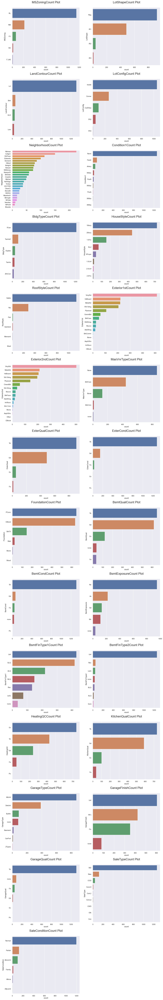

In [577]:
# counterplot for Analysis of Categorical column
plt.figure(figsize=(15,110))#The size of the plot
c=0
for i in Cat_cols:
    c=c+1
    plt.subplot(17,2,c)
    sns.countplot(y=house_df[i],order=house_df[i].value_counts().index)
    plt.title(i +"Count Plot\n",fontsize=20)#The title of the plot
plt.tight_layout()#to avoid overlapping layout
plt.show()#to display the plot

## univariate analysis for numerical variable

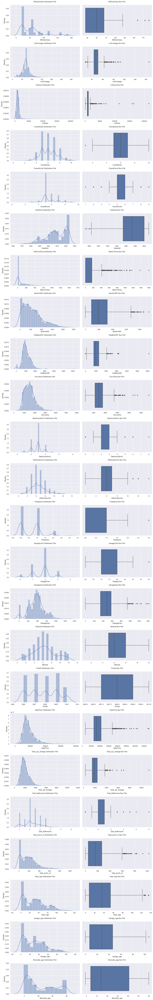

In [578]:
# univariate analysis for numerical variable
plt.figure(figsize=(15,100))#The size of the plot
c=0
for i in Num_cols:
    c=c+1
    plt.subplot(25,2,c)
    sns.distplot(house_df[i])
    plt.title(i +" Distribution Plot \n")
    c=c+1
    plt.subplot(25,2,c)
    sns.boxplot(house_df[i])
    plt.title(i +" Box Plot \n")
plt.tight_layout()
plt.show()

## OUTLIERS TReatrment

Here we able to seen that here have some columns that have some outliers So we removing that columns that columns have follwing. And here i am taking 97% quantileas a critical. LotFrontage','LotArea','MasVnrArea','GrLivArea','Total_sqr_footage','Total_porch_sf And also other columns have outliers but due to there columns importance we didn't removed them

In [579]:
LotFrontage95 = house_df['LotFrontage'].quantile(0.97)
house_df = house_df[house_df['LotFrontage'] <= LotFrontage95]

LotArea95 = house_df['LotArea'].quantile(0.97)
house_df = house_df[house_df['LotArea'] <= LotArea95]

MasVnrArea95 = house_df['MasVnrArea'].quantile(0.97)
house_df = house_df[house_df['MasVnrArea'] <= MasVnrArea95]

GrLivArea95 = house_df['GrLivArea'].quantile(0.97)
house_df = house_df[house_df['GrLivArea'] <= GrLivArea95]

Total_sqr_footage95 = house_df['Total_sqr_footage'].quantile(0.97)
house_df = house_df[house_df['Total_sqr_footage'] <= Total_sqr_footage95]

Total_porch_sf95 = house_df['Total_porch_sf'].quantile(0.97)
house_df = house_df[house_df['Total_porch_sf'] <= Total_porch_sf95]

In [580]:
house_df.shape

(1215, 51)

## Bivariate analysis for categorial data variable

Target variable is SalePrice so we now Doing data analysis with respect to SalePrice  with categorical data and numerical varibles

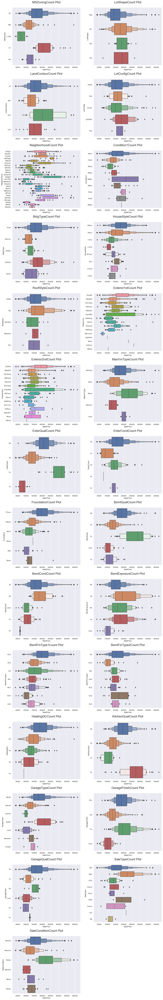

In [581]:
# Bivariate analysis for categorial data variable
plt.figure(figsize=(15,110))#The size of the plot
c=0
for i in Cat_cols:
    c=c+1
    plt.subplot(17,2,c)
    sns.boxenplot(x='SalePrice',y=house_df[i],data=house_df)
    plt.title(i +"Count Plot\n",fontsize=20)#The title of the plot
plt.tight_layout()#to avoid overlapping layout
plt.show()#to display the plot

## Bivariate analysis for numeriacl data variable

<Figure size 7000x9000 with 0 Axes>

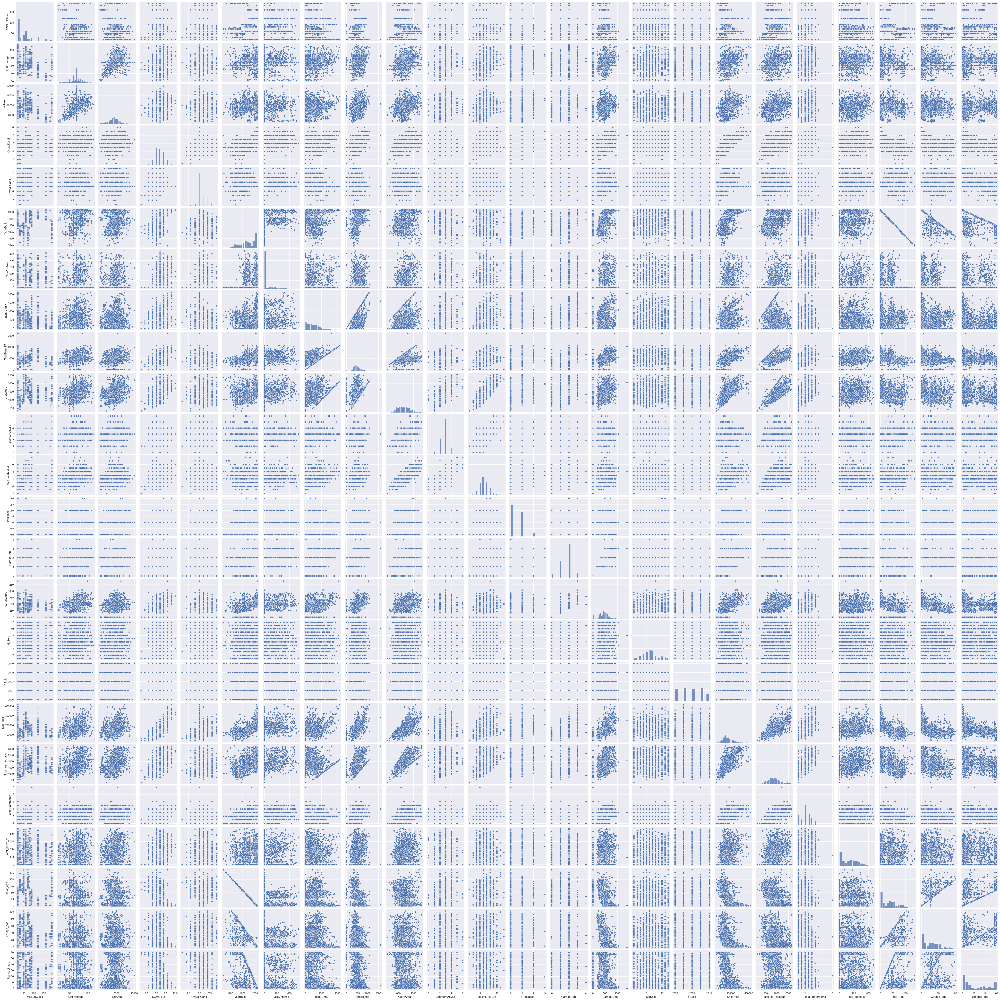

In [582]:
plt.figure(figsize = (70, 90))
sns.pairplot(house_df, vars= Num_cols)
plt.show()


In [583]:
# correlation matrix
cor = house_df[Num_cols].corr()
cor

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,MasVnrArea,BsmtUnfSF,TotalBsmtSF,GrLivArea,BedroomAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,MoSold,YrSold,SalePrice,Total_sqr_footage,Total_Bathrooms,Total_porch_sf,Total_Age,Garage_age,Remodel_age
MSSubClass,1.000000,-0.459086,-0.460474,0.075704,-0.078614,0.064099,0.045715,-0.145410,-0.244566,0.101355,-0.085241,0.026496,-0.019949,-0.025147,-0.096006,-0.020878,-0.004463,-0.071795,0.018810,0.187037,-0.029579,-0.064224,-0.110993,-0.056741
LotFrontage,-0.459086,1.000000,0.596349,0.160503,-0.038064,0.115358,0.138834,0.145459,0.288372,0.291683,0.284804,0.290309,0.173149,0.261126,0.304028,0.039842,-0.005495,0.336372,0.291926,0.116645,0.130622,-0.115470,-0.048410,-0.047499
LotArea,-0.460474,0.596349,1.000000,0.131182,-0.032344,0.064544,0.082852,0.099737,0.269794,0.333815,0.326953,0.338768,0.246148,0.232776,0.272516,0.002377,-0.029486,0.344273,0.346919,0.160495,0.158758,-0.065778,0.004325,-0.017864
OverallQual,0.075704,0.160503,0.131182,1.000000,-0.097966,0.594875,0.329272,0.335293,0.481779,0.543447,0.088837,0.340600,0.368666,0.569124,0.511803,0.081965,-0.013090,0.801806,0.458390,0.504027,0.278815,-0.594777,-0.508184,-0.541816
OverallCond,-0.078614,-0.038064,-0.032344,-0.097966,1.000000,-0.355461,-0.096256,-0.159600,-0.165814,-0.146237,-0.009880,-0.095489,-0.035448,-0.178707,-0.138908,-0.013439,0.026447,-0.098095,-0.092274,-0.201353,0.007811,0.356228,0.313821,-0.067417
YearBuilt,0.064099,0.115358,0.064544,0.594875,-0.355461,1.000000,0.298096,0.169438,0.405382,0.227345,-0.059896,0.075140,0.156967,0.558759,0.503504,0.031053,-0.003551,0.627921,0.317235,0.567142,0.112694,-0.999017,-0.787726,-0.610197
MasVnrArea,0.045715,0.138834,0.082852,0.329272,-0.096256,0.298096,1.000000,0.104757,0.293978,0.267367,0.089390,0.191602,0.219386,0.305478,0.295043,0.011531,0.023657,0.360683,0.314147,0.252674,0.110779,-0.296707,-0.208976,-0.138172
BsmtUnfSF,-0.145410,0.145459,0.099737,0.335293,-0.159600,0.169438,0.104757,1.000000,0.507402,0.304417,0.167702,0.282050,0.076044,0.233370,0.210873,0.067331,-0.034270,0.285070,-0.223429,-0.103931,0.044145,-0.170763,-0.186125,-0.203401
TotalBsmtSF,-0.244566,0.288372,0.269794,0.481779,-0.165814,0.405382,0.293978,0.507402,1.000000,0.295120,0.049732,0.169309,0.247246,0.403434,0.424318,0.058107,0.001547,0.595747,0.496772,0.326631,0.214757,-0.404851,-0.313043,-0.289099
GrLivArea,0.101355,0.291683,0.333815,0.543447,-0.146237,0.227345,0.267367,0.304417,0.295120,1.000000,0.546745,0.800904,0.405573,0.423331,0.384753,0.063309,-0.014136,0.647916,0.672050,0.506707,0.255228,-0.227713,-0.217550,-0.265615


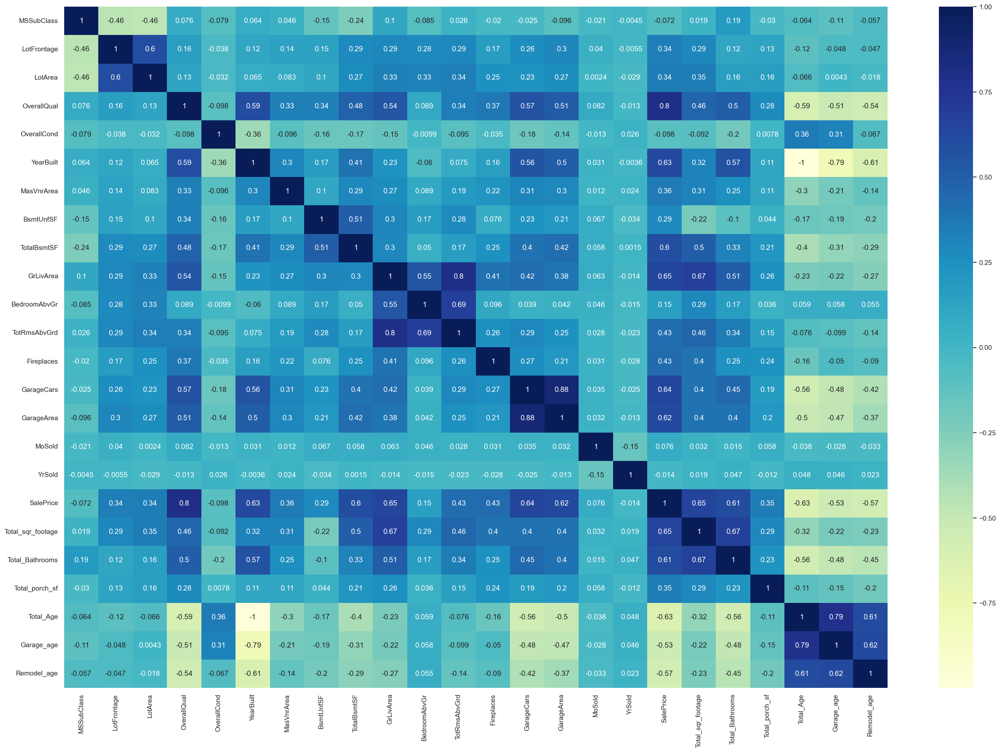

In [584]:
plt.figure(figsize=(30,20))

# heatmap
sns.heatmap(cor, cmap="YlGnBu", annot=True)
plt.show()

In [585]:
house_df.corr()['SalePrice'].round(decimals = 2).sort_values(ascending=False)

SalePrice            1.00
OverallQual          0.80
GrLivArea            0.65
Total_sqr_footage    0.65
GarageCars           0.64
YearBuilt            0.63
GarageArea           0.62
Total_Bathrooms      0.61
TotalBsmtSF          0.60
TotRmsAbvGrd         0.43
Fireplaces           0.43
MasVnrArea           0.36
Total_porch_sf       0.35
LotFrontage          0.34
LotArea              0.34
BsmtUnfSF            0.29
BedroomAbvGr         0.15
MoSold               0.08
YrSold              -0.01
MSSubClass          -0.07
OverallCond         -0.10
Garage_age          -0.53
Remodel_age         -0.57
Total_Age           -0.63
Name: SalePrice, dtype: float64

#### We can clearly observe that the SalesPrice is mostly corelated with variables like OverallQual, GrLivArea, Total_sqr_footage and GarageCars, YearBuilt, Total_Age.

In [586]:
house_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1215 entries, 0 to 1457
Data columns (total 51 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   MSSubClass         1215 non-null   int64  
 1   MSZoning           1215 non-null   object 
 2   LotFrontage        1215 non-null   float64
 3   LotArea            1215 non-null   int64  
 4   LotShape           1215 non-null   object 
 5   LandContour        1215 non-null   object 
 6   LotConfig          1215 non-null   object 
 7   Neighborhood       1215 non-null   object 
 8   Condition1         1215 non-null   object 
 9   BldgType           1215 non-null   object 
 10  HouseStyle         1215 non-null   object 
 11  OverallQual        1215 non-null   int64  
 12  OverallCond        1215 non-null   int64  
 13  YearBuilt          1215 non-null   int64  
 14  RoofStyle          1215 non-null   object 
 15  Exterior1st        1215 non-null   object 
 16  Exterior2nd        1215 

In [587]:
#Lets change the datatype of categorical columns from object to category
Cat_cols = []
for i in house_df.columns :
    if house_df[i].dtype == "object":
        house_df[i]=house_df[i].astype('category')
        Cat_cols.append(i)
        

house_df.info()#displaying the Datatypes

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1215 entries, 0 to 1457
Data columns (total 51 columns):
 #   Column             Non-Null Count  Dtype   
---  ------             --------------  -----   
 0   MSSubClass         1215 non-null   int64   
 1   MSZoning           1215 non-null   category
 2   LotFrontage        1215 non-null   float64 
 3   LotArea            1215 non-null   int64   
 4   LotShape           1215 non-null   category
 5   LandContour        1215 non-null   category
 6   LotConfig          1215 non-null   category
 7   Neighborhood       1215 non-null   category
 8   Condition1         1215 non-null   category
 9   BldgType           1215 non-null   category
 10  HouseStyle         1215 non-null   category
 11  OverallQual        1215 non-null   int64   
 12  OverallCond        1215 non-null   int64   
 13  YearBuilt          1215 non-null   int64   
 14  RoofStyle          1215 non-null   category
 15  Exterior1st        1215 non-null   category
 16  Exteri

In [588]:
house_df.shape

(1215, 51)

In [589]:
#creating dummy variables 
house_df = pd.get_dummies(house_df,drop_first=True)
house_df.info()#displaying the updated Datatypes

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1215 entries, 0 to 1457
Columns: 187 entries, MSSubClass to SaleCondition_Partial
dtypes: float64(4), int64(20), uint8(163)
memory usage: 463.0 KB


In [590]:
Cat_cols
house_df.columns

Index(['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond',
       'YearBuilt', 'MasVnrArea', 'BsmtUnfSF', 'TotalBsmtSF', 'GrLivArea',
       ...
       'SaleType_ConLI', 'SaleType_ConLw', 'SaleType_New', 'SaleType_Oth',
       'SaleType_WD', 'SaleCondition_AdjLand', 'SaleCondition_Alloca',
       'SaleCondition_Family', 'SaleCondition_Normal',
       'SaleCondition_Partial'],
      dtype='object', length=187)

In [591]:
house_df.head()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,MasVnrArea,BsmtUnfSF,TotalBsmtSF,GrLivArea,BedroomAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,MoSold,YrSold,SalePrice,Total_sqr_footage,Total_Bathrooms,Total_porch_sf,Total_Age,Garage_age,Remodel_age,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,...,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtExposure_none,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType1_none,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_Rec,BsmtFinType2_Unf,BsmtFinType2_none,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_none,GarageFinish_RFn,GarageFinish_Unf,GarageFinish_none,GarageQual_Fa,GarageQual_Gd,GarageQual_Po,GarageQual_TA,GarageQual_none,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,60,65.0,8450,7,5,2003,196.0,150,856,1710,3,8,0,2,548,2,2008,208500,2416,3.5,61,5,5.0,5,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,...,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0
1,20,80.0,9600,6,8,1976,0.0,284,1262,1262,3,6,1,2,460,5,2007,181500,2240,2.5,298,31,31.0,31,0,0,1,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0
2,60,68.0,11250,7,5,2001,162.0,434,920,1786,3,6,1,2,608,9,2008,223500,2272,3.5,42,7,7.0,6,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,...,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0
3,70,60.0,9550,7,5,1915,0.0,540,756,1717,3,7,1,3,642,2,2006,140000,1933,2.0,307,91,8.0,36,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0
4,60,84.0,14260,8,5,2000,350.0,490,1145,2198,4,9,1,3,836,12,2008,250000,2853,3.5,276,8,8.0,8,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0


In [592]:
house_df.shape

(1215, 187)

Now we able to seen that now we have 187 columns and 1215 rows

# DATA Spilitting Analysis in TEST and Train

In [593]:
# data spliting 70% for tarning and 30% for test data
X = house_df.drop(['SalePrice'], axis=1)

X.head()


,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,MasVnrArea,BsmtUnfSF,TotalBsmtSF,GrLivArea,BedroomAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,MoSold,YrSold,Total_sqr_footage,Total_Bathrooms,Total_porch_sf,Total_Age,Garage_age,Remodel_age,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,...,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtExposure_none,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType1_none,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_Rec,BsmtFinType2_Unf,BsmtFinType2_none,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_none,GarageFinish_RFn,GarageFinish_Unf,GarageFinish_none,GarageQual_Fa,GarageQual_Gd,GarageQual_Po,GarageQual_TA,GarageQual_none,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,60,65.0,8450,7,5,2003,196.0,150,856,1710,3,8,0,2,548,2,2008,2416,3.5,61,5,5.0,5,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,...,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0
1,20,80.0,9600,6,8,1976,0.0,284,1262,1262,3,6,1,2,460,5,2007,2240,2.5,298,31,31.0,31,0,0,1,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0
2,60,68.0,11250,7,5,2001,162.0,434,920,1786,3,6,1,2,608,9,2008,2272,3.5,42,7,7.0,6,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,...,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0
3,70,60.0,9550,7,5,1915,0.0,540,756,1717,3,7,1,3,642,2,2006,1933,2.0,307,91,8.0,36,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0
4,60,84.0,14260,8,5,2000,350.0,490,1145,2198,4,9,1,3,836,12,2008,2853,3.5,276,8,8.0,8,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0


In [594]:
# Putting response variable to y
y = house_df['SalePrice']

y.head()

0    208500
1    181500
2    223500
3    140000
4    250000
Name: SalePrice, dtype: int64

In [595]:
#Lets extract the numerical columns from the df_train
# categorised dataframe columns in numeriacl type data and categorical data
Cat_cols1 = []
Num_cols1 = []
for i in X.columns :
    if X[i].dtype == "object":
        Cat_cols1.append(i)
    else:
        Num_cols1.append(i)
Num_cols1

['MSSubClass',
 'LotFrontage',
 'LotArea',
 'OverallQual',
 'OverallCond',
 'YearBuilt',
 'MasVnrArea',
 'BsmtUnfSF',
 'TotalBsmtSF',
 'GrLivArea',
 'BedroomAbvGr',
 'TotRmsAbvGrd',
 'Fireplaces',
 'GarageCars',
 'GarageArea',
 'MoSold',
 'YrSold',
 'Total_sqr_footage',
 'Total_Bathrooms',
 'Total_porch_sf',
 'Total_Age',
 'Garage_age',
 'Remodel_age',
 'MSZoning_FV',
 'MSZoning_RH',
 'MSZoning_RL',
 'MSZoning_RM',
 'LotShape_IR2',
 'LotShape_IR3',
 'LotShape_Reg',
 'LandContour_HLS',
 'LandContour_Low',
 'LandContour_Lvl',
 'LotConfig_CulDSac',
 'LotConfig_FR2',
 'LotConfig_FR3',
 'LotConfig_Inside',
 'Neighborhood_Blueste',
 'Neighborhood_BrDale',
 'Neighborhood_BrkSide',
 'Neighborhood_ClearCr',
 'Neighborhood_CollgCr',
 'Neighborhood_Crawfor',
 'Neighborhood_Edwards',
 'Neighborhood_Gilbert',
 'Neighborhood_IDOTRR',
 'Neighborhood_MeadowV',
 'Neighborhood_Mitchel',
 'Neighborhood_NAmes',
 'Neighborhood_NPkVill',
 'Neighborhood_NWAmes',
 'Neighborhood_NoRidge',
 'Neighborhood_NridgH

In [596]:
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7, test_size=0.3, random_state=100)
print ("The Size of Train data is",X_train.shape)
print ("The Size of Test data is",X_test.shape)

The Size of Train data is (850, 186)
The Size of Test data is (365, 186)


In [597]:
# scalling the numerical type  data
Scaler = MinMaxScaler() # Instantiate an objectr
X_train[Num_cols1] = Scaler.fit_transform(X_train[Num_cols1])

# scaling Output variable
#y_train = pd.DataFrame(y_train)

X_test[Num_cols1] = Scaler.transform(X_test[Num_cols1])


In [598]:
y_train

1087    252000
1191    174000
1146    180000
555     113000
663     137500
         ...  
967     135000
63      140000
430      85400
95      185000
954     127500
Name: SalePrice, Length: 850, dtype: int64

In [599]:
y_train = pd.DataFrame(y_train)

In [600]:
y_train

,SalePrice
1087,252000
1191,174000
1146,180000
555,113000
663,137500
...,...
967,135000
63,140000
430,85400
95,185000


In [601]:
y_train.SalePrice = Scaler.fit_transform(y_train)

In [602]:
y_train = y_train.SalePrice

In [603]:
y_train

1087    0.570254
1191    0.364984
1146    0.380774
555     0.204452
663     0.268928
          ...   
967     0.262348
63      0.275507
430     0.131818
95      0.393932
954     0.242611
Name: SalePrice, Length: 850, dtype: float64

In [604]:
y_test = pd.DataFrame(y_test)
y_test

,SalePrice
333,207000
140,115000
301,267000
21,139400
1357,149900
...,...
592,138000
710,52000
1326,79000
645,143250


In [605]:
y_test.SalePrice = Scaler.transform(y_test)

In [606]:
y_test = y_test.SalePrice

In [607]:

y_test

333     0.451829
140     0.209715
301     0.609729
21      0.273928
1357    0.301560
          ...   
592     0.270243
710     0.043920
1326    0.114975
645     0.284060
824     0.519199
Name: SalePrice, Length: 365, dtype: float64

In [608]:
# visualising the data
X_train[Num_cols1].describe()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,MasVnrArea,BsmtUnfSF,TotalBsmtSF,GrLivArea,BedroomAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,MoSold,YrSold,Total_sqr_footage,Total_Bathrooms,Total_porch_sf,Total_Age,Garage_age,Remodel_age,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,...,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtExposure_none,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType1_none,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_Rec,BsmtFinType2_Unf,BsmtFinType2_none,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_none,GarageFinish_RFn,GarageFinish_Unf,GarageFinish_none,GarageQual_Fa,GarageQual_Gd,GarageQual_Po,GarageQual_TA,GarageQual_none,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
count,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,...,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000,850.000000
mean,0.226228,0.482783,0.409184,0.620000,0.574559,0.722937,0.141946,0.261013,0.311549,0.483514,0.462745,0.420941,0.173333,0.421176,0.319905,0.481390,0.464412,0.516618,0.222706,0.326996,0.270701,0.292607,0.395196,0.049412,0.010588,0.767059,0.168235,0.017647,0.002353,0.663529,0.029412,0.015294,0.911765,0.049412,0.035294,0.001176,0.751765,0.002353,0.015294,0.041176,0.010588,0.112941,0.036471,0.075294,0.056471,0.020000,0.012941,0.034118,0.164706,0.009412,...,0.063529,0.068235,0.678824,0.029412,0.107059,0.267059,0.051765,0.087059,0.296471,0.028235,0.024706,0.010588,0.029412,0.035294,0.860000,0.029412,0.038824,0.170588,0.001176,0.303529,0.025882,0.391765,0.540000,0.600000,0.011765,0.043529,0.005882,0.278824,0.055294,0.307059,0.436471,0.055294,0.038824,0.005882,0.002353,0.896471,0.055294,0.004706,0.001176,0.005882,0.003529,0.005882,0.083529,0.002353,0.861176,0.003529,0.010588,0.010588,0.818824,0.084706
std,0.261492,0.180275,0.170595,0.156019,0.132684,0.216474,0.228811,0.207166,0.119260,0.174510,0.126038,0.136623,0.200170,0.174893,0.139195,0.249500,0.337115,0.188373,0.146139,0.254716,0.218459,0.236217,0.347507,0.216854,0.102413,0.422954,0.374295,0.131742,0.048479,0.472780,0.169057,0.122792,0.283804,0.216854,0.184631,0.034300,0.432243,0.048479,0.122792,0.198815,0.102413,0.316707,0.187568,0.264021,0.230964,0.140082,0.113087,0

## Automated selection of Predictors (RFE)

In [609]:
#Fit the Model
lr = LinearRegression()
#Since we have 187 columns in the X_train, lets select only 100 using RFE
rfe = RFE(lr, n_features_to_select=100)
rfe = rfe.fit(X_train,y_train)
 


In [610]:
list(zip(X_train.columns,rfe.support_,rfe.ranking_))

[('MSSubClass', True, 1),
 ('LotFrontage', True, 1),
 ('LotArea', True, 1),
 ('OverallQual', True, 1),
 ('OverallCond', True, 1),
 ('YearBuilt', True, 1),
 ('MasVnrArea', False, 66),
 ('BsmtUnfSF', True, 1),
 ('TotalBsmtSF', False, 22),
 ('GrLivArea', True, 1),
 ('BedroomAbvGr', True, 1),
 ('TotRmsAbvGrd', False, 8),
 ('Fireplaces', True, 1),
 ('GarageCars', False, 10),
 ('GarageArea', True, 1),
 ('MoSold', False, 71),
 ('YrSold', True, 1),
 ('Total_sqr_footage', True, 1),
 ('Total_Bathrooms', True, 1),
 ('Total_porch_sf', True, 1),
 ('Total_Age', True, 1),
 ('Garage_age', False, 2),
 ('Remodel_age', True, 1),
 ('MSZoning_FV', True, 1),
 ('MSZoning_RH', True, 1),
 ('MSZoning_RL', True, 1),
 ('MSZoning_RM', True, 1),
 ('LotShape_IR2', False, 53),
 ('LotShape_IR3', True, 1),
 ('LotShape_Reg', False, 48),
 ('LandContour_HLS', True, 1),
 ('LandContour_Low', True, 1),
 ('LandContour_Lvl', True, 1),
 ('LotConfig_CulDSac', True, 1),
 ('LotConfig_FR2', True, 1),
 ('LotConfig_FR3', True, 1),
 (

In [611]:
#selected columns from rfe
col = X_train.columns[rfe.support_]
col

Index(['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond',
       'YearBuilt', 'BsmtUnfSF', 'GrLivArea', 'BedroomAbvGr', 'Fireplaces',
       'GarageArea', 'YrSold', 'Total_sqr_footage', 'Total_Bathrooms',
       'Total_porch_sf', 'Total_Age', 'Remodel_age', 'MSZoning_FV',
       'MSZoning_RH', 'MSZoning_RL', 'MSZoning_RM', 'LotShape_IR3',
       'LandContour_HLS', 'LandContour_Low', 'LandContour_Lvl',
       'LotConfig_CulDSac', 'LotConfig_FR2', 'LotConfig_FR3',
       'Neighborhood_Blueste', 'Neighborhood_BrDale', 'Neighborhood_BrkSide',
       'Neighborhood_Crawfor', 'Neighborhood_Gilbert', 'Neighborhood_NPkVill',
       'Neighborhood_NoRidge', 'Neighborhood_NridgHt', 'Neighborhood_StoneBr',
       'Neighborhood_Timber', 'Condition1_Feedr', 'Condition1_Norm',
       'Condition1_PosA', 'Condition1_PosN', 'Condition1_RRAe',
       'Condition1_RRAn', 'Condition1_RRNe', 'Condition1_RRNn',
       'BldgType_Duplex', 'BldgType_Twnhs', 'BldgType_TwnhsE',
       'RoofStyle_

In [612]:
#skipped columns from rfe
X_train.columns[~rfe.support_]

Index(['MasVnrArea', 'TotalBsmtSF', 'TotRmsAbvGrd', 'GarageCars', 'MoSold',
       'Garage_age', 'LotShape_IR2', 'LotShape_Reg', 'LotConfig_Inside',
       'Neighborhood_ClearCr', 'Neighborhood_CollgCr', 'Neighborhood_Edwards',
       'Neighborhood_IDOTRR', 'Neighborhood_MeadowV', 'Neighborhood_Mitchel',
       'Neighborhood_NAmes', 'Neighborhood_NWAmes', 'Neighborhood_OldTown',
       'Neighborhood_SWISU', 'Neighborhood_Sawyer', 'Neighborhood_SawyerW',
       'Neighborhood_Somerst', 'Neighborhood_Veenker', 'BldgType_2fmCon',
       'HouseStyle_1.5Unf', 'HouseStyle_1Story', 'HouseStyle_2.5Fin',
       'HouseStyle_2.5Unf', 'HouseStyle_2Story', 'HouseStyle_SFoyer',
       'HouseStyle_SLvl', 'RoofStyle_Gable', 'RoofStyle_Hip',
       'Exterior1st_AsphShn', 'Exterior1st_BrkComm', 'Exterior1st_HdBoard',
       'Exterior1st_ImStucc', 'Exterior1st_MetalSd', 'Exterior1st_Plywood',
       'Exterior1st_Stone', 'Exterior1st_Stucco', 'Exterior1st_VinylSd',
       'Exterior1st_Wd Sdng', 'Exterior1s

# building model using State model

In [613]:
#ceating X_train with RFE selected columns
X_train_rfe1 = X_train[col]
X_test_rfe = X_test[col]
# adding constant to model
X_train_rfe = sm.add_constant(X_train_rfe1)
print(X_train_rfe.shape)
print(X_test_rfe.shape)

(850, 101)
(365, 100)


In [614]:
# runing the rfe model
lm = sm.OLS(y_train,X_train_rfe).fit()

In [615]:
# getting summery of model
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.924
Model:                            OLS   Adj. R-squared:                  0.915
Method:                 Least Squares   F-statistic:                     100.4
Date:                Wed, 26 Apr 2023   Prob (F-statistic):               0.00
Time:                        21:38:21   Log-Likelihood:                 1494.9
No. Observations:                 850   AIC:                            -2804.
Df Residuals:                     757   BIC:                            -2362.
Df Model:                          92                                         
Covariance Type:            nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                    -0.0694      0.034     -2.060      0.040      -0.135      -0.003
MSSubClass               -0.0305      0.012     -2.635      0.009      -0.053      -0.008
LotFrontage               0.0217      0.014      1.523      0.128      -0.006       0.050
LotArea                   0.0826      0.015      5.533      0.000       0.053       0.112
OverallQual               0.1655      0.019      8.793      0.000       0.129       0.202
OverallCond               0.1058      0.016      6.683      0.000       0.075       0.137
YearBuilt                 0.0610      0.019      3.154      0.002       0.023       0.099
BsmtUnfSF                 0.0819      0.016      5.237      0.000       0.051       0.113
GrLivArea                 0.0969      0.025      3.924      0.000       0.048       0.145
BedroomAbvGr             -0.0356      0.019     -1.902      0.057      -0.072       0.001
Fireplaces                0.0276      0.010      2.864      0.004       0.009       0.047
GarageArea                0.0662      0.019      3.418      0.001       0.028       0.104
YrSold                    0.0018      0.005      0.371      0.711      -0.008       0.011
Total_sqr_footage         0.1907      0.024      8.011      0.000       0.144       0.237
Total_Bathrooms           0.0554      0.019      2.921      0.004       0.018       0.093
Total_porch_sf            0.0357      0.007      5.146      0.000       0.022       0.049
Total_Age                -0.1297      0.019     -6.930      0.000      -0.166      -0.093
Remodel_age              -0.0194      0.008     -2.561      0.011      -0.034      -0.005
MSZoning_FV               0.0621      0.026      2.391      0.017       0.011       0.113
MSZoning_RH               0.0256      0.028      0.911      0.363      -0.030       0.081
MSZoning_RL               0.0228      0.024      0.933      0.351      -0.025       0.071
MSZoning_RM               0.0174      0.025      0.705      0.481      -0.031       0.066
LotShape_IR3             -0.0449      0.035     -1.296      0.195      -0.113       0.023
LandContour_HLS           0.0319      0.013      2.414      0.016       0.006       0.058
LandContour_Low          -0.0327      0.016     -2.056      0.040      -0.064      -0.001
LandContour_Lvl          -0.0205      0.008     -2.516      0.012      -0.036      -0.004
LotConfig_CulDSac         0.0164      0.008      2.113      0.035       0.001       0.032
LotConfig_FR2            -0.0163      0.009     -1.811      0.071      -0.034       0.001
LotConfig_FR3             0.0154      0.046      0.337      0.736      -0.074       0.105
Neighborhood_Blueste      0.0514      0.033      1.557      0.120      -0.013       0.116
Neighborhood_BrDale       0.0299      0.016      1.845      0.065      -0.002       0.062
Neighborhood_BrkSide   

In [616]:
#check VIF of RFE Model
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by='VIF',ascending=False)
vif

,Features,VIF
12,YrSold,inf
74,BsmtQual_none,inf
91,GarageFinish_none,inf
90,GarageType_none,inf
53,Exterior1st_CBlock,inf
...,...,...
96,SaleType_Con,1.06
71,Foundation_Wood,1.05
0,const,0.00
45,Condition1_RRNe,NaN


In [617]:
y_train_pred = lm.predict(X_train_rfe)

In [618]:
y_train_pred

1087    0.563648
1191    0.364944
1146    0.393465
555     0.189413
663     0.267927
          ...   
967     0.247951
63      0.272710
430     0.150550
95      0.430783
954     0.251354
Length: 850, dtype: float64

In [619]:
X_test_rfe = sm.add_constant(X_test[col])

In [620]:
y_testpred = lm.predict(X_test_rfe)

In [621]:
y_testpred

333     0.495179
140     0.164562
301     0.539777
21      0.241222
1357    0.322565
          ...   
592     0.307738
710     0.095656
1326    0.116806
645     0.282704
824     0.533763
Length: 365, dtype: float64

Text(0, 0.5, 'Sales Price')

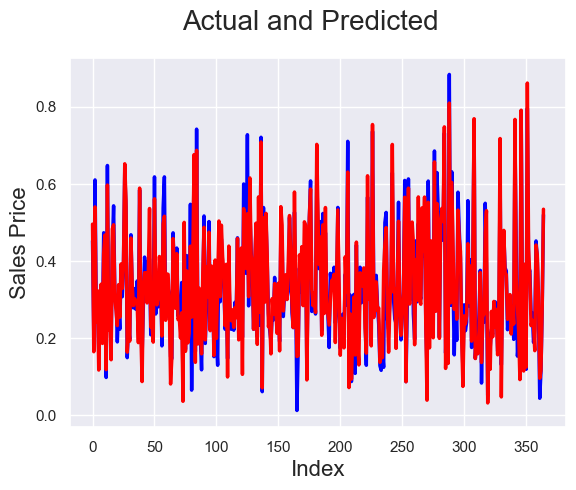

In [622]:
# Simple Linear Regression with 100 features: Actual vs Predicted
c = [i for i in range(0,y_test.shape[0],1)]
fig = plt.figure()
plt.plot(c, y_test, color="blue", linewidth=2.5, linestyle="-")
plt.plot(c, y_testpred, color="red",  linewidth=2.5, linestyle="-")
fig.suptitle('Actual and Predicted', fontsize=20)              # Plot heading 
plt.xlabel('Index', fontsize=16)                               # X-label
plt.ylabel('Sales Price', fontsize=16)     


### Ressidual VS Predicted values 

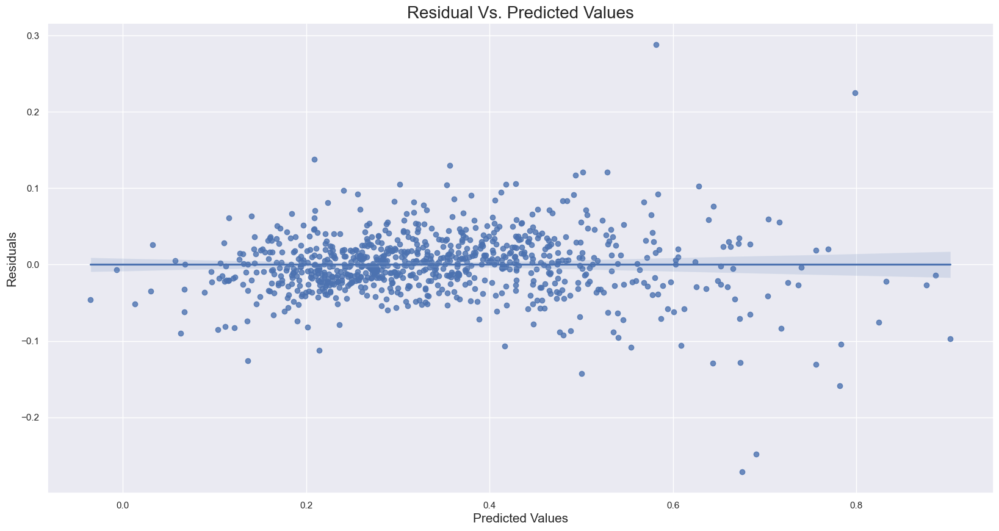

In [623]:
sns.set_theme(color_codes=True)
plt.figure(figsize=(20,10))
sns.regplot(x=y_train_pred, y= y_train_pred - y_train)
plt.title('Residual Vs. Predicted Values', fontdict={'fontsize': 20})
plt.xlabel('Predicted Values', fontdict={'fontsize': 15})
plt.ylabel('Residuals', fontdict={'fontsize': 15})
plt.show()

In [624]:
metric = []
r2_train_lr = r2_score(y_train, y_train_pred)
print(r2_train_lr)
metric.append(r2_train_lr)

r2_test_lr = r2_score(y_test, y_testpred)
print(r2_test_lr)
metric.append(r2_test_lr)

rss1_lr = np.sum(np.square(y_train - y_train_pred))
print(rss1_lr)
metric.append(rss1_lr)

rss2_lr = np.sum(np.square(y_test - y_testpred))
print(rss2_lr)
metric.append(rss2_lr)

mse_train_lr = mean_squared_error(y_train, y_train_pred)
print(mse_train_lr)
metric.append(mse_train_lr**0.5)

mse_test_lr = mean_squared_error(y_test, y_testpred)
print(mse_test_lr)
metric.append(mse_test_lr**0.5)

0.9242386471467402
0.8927448427772969
1.4770750940794615
0.9102559476474932
0.0017377354047993664
0.002493851911362995



So, now to check if the  are also normally distributed (which is infact, one of the major assumptions of linear regression), let us plot the histogram of the error terms and see what it looks like.

Observation - from  comparing trian and test r2_score it seems seems to be overfit becuase r2_score test < r4 score train

Lets use L1 and L2 regularizations to reduce the complexity and overfitting in the model

 ## check for Linear Regrssion Assumptions are true or not

### Error Terms

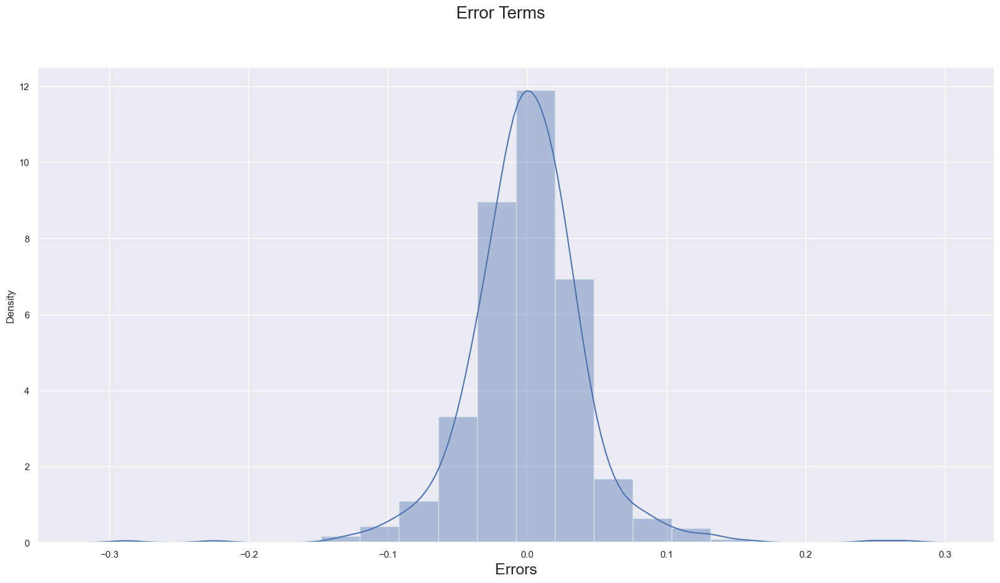

In [625]:
# Plot the histogram of the error terms
sns.set_theme(color_codes=True)
plt.figure(figsize=(20,10))
sns.distplot((y_train - y_train_pred), bins = 20)
plt.suptitle('Error Terms', fontsize = 20)                  # Plot heading 
plt.xlabel('Errors', fontsize = 18)  
plt.show()# X-label

### Assumption of Error Terms Being Independent

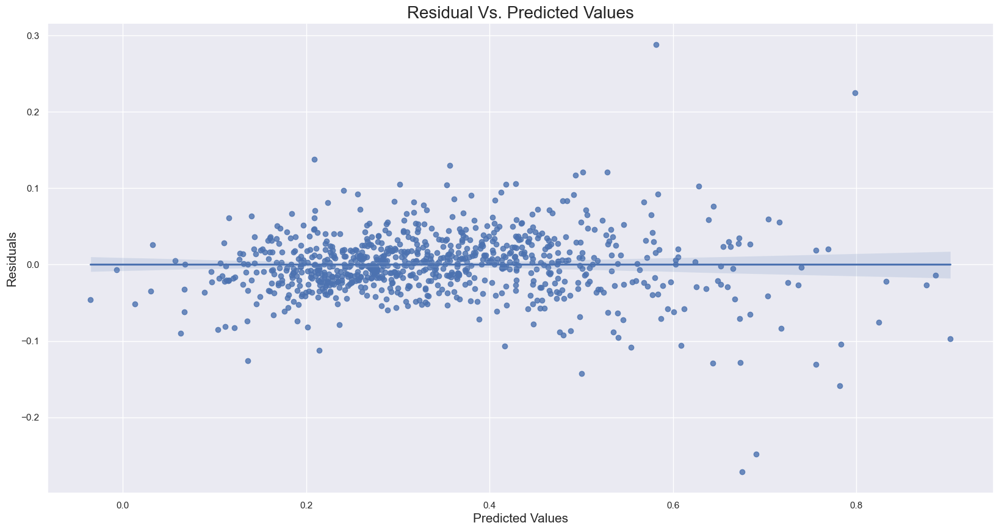

In [626]:
sns.set_theme(color_codes=True)
plt.figure(figsize=(20,10))
sns.regplot(x=y_train_pred, y= y_train_pred - y_train)
plt.title('Residual Vs. Predicted Values', fontdict={'fontsize': 20})
plt.xlabel('Predicted Values', fontdict={'fontsize': 15})
plt.ylabel('Residuals', fontdict={'fontsize': 15})
plt.show()

We can clearly see that as the predected values increase the residual error increases

### Homoscedasticity

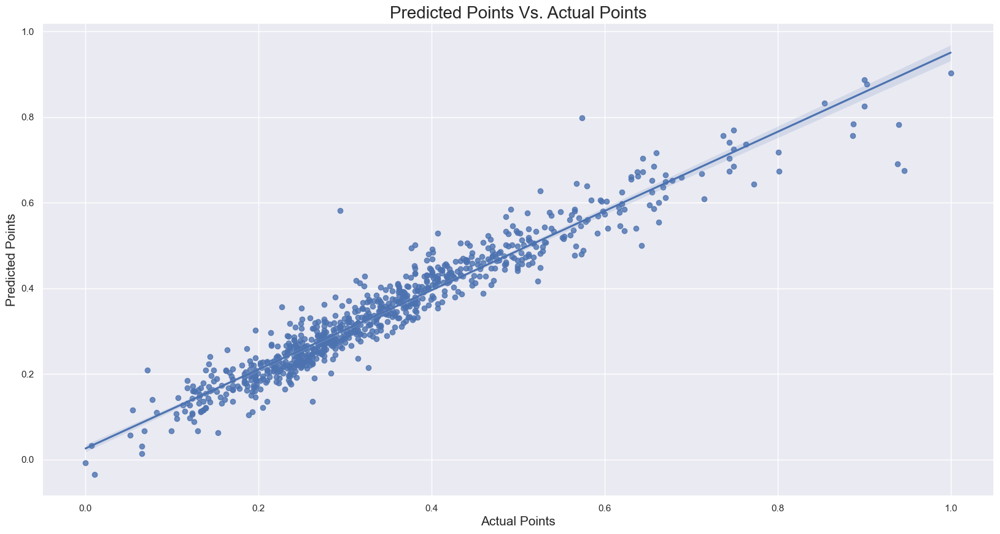

In [627]:
sns.set_theme(color_codes=True)
plt.figure(figsize=(20,10))
sns.regplot(x=y_train, y=y_train_pred)
plt.title('Predicted Points Vs. Actual Points', fontdict={'fontsize': 20})
plt.xlabel('Actual Points', fontdict={'fontsize': 15})
plt.ylabel('Predicted Points', fontdict={'fontsize': 15})
plt.show()

# RIEDGE Regularisation

In [628]:
# list of alphas to tune - if value too high it will lead to underfitting, if it is too low, 
# it will not handle the overfitting
params = {'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 
 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 
 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 500, 1000 ]}

ridge = Ridge()

# cross validation
folds = 5
ridge_model_cv = GridSearchCV(estimator = ridge, 
                        param_grid = params, 
                        scoring= 'neg_mean_absolute_error',  
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            
ridge_model_cv.fit(X_train, y_train) 
#https://scikit-learn.org/stable/modules/model_evaluation.html

Fitting 5 folds for each of 28 candidates, totalling 140 fits


GridSearchCV(cv=5, estimator=Ridge(),
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3,
                                   0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
                                   4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50,
                                   100, 500, 1000]},
             return_train_score=True, scoring='neg_mean_absolute_error',
             verbose=1)

In [629]:
# Printing the best hyperparameter alpha
print(ridge_model_cv.best_params_)

{'alpha': 3.0}


In [630]:
ridge_cv_results = pd.DataFrame(ridge_model_cv.cv_results_)
ridge_cv_results = ridge_cv_results[ridge_cv_results['param_alpha']<=500]
ridge_cv_results[['param_alpha', 'mean_train_score', 'mean_test_score', 'rank_test_score']].sort_values(by = ['rank_test_score'])

,param_alpha,mean_train_score,mean_test_score,rank_test_score
15,3.0,-0.028429,-0.034907,1
14,2.0,-0.027877,-0.034943,2
16,4.0,-0.028960,-0.034983,3
17,5.0,-0.029470,-0.035157,4
18,6.0,-0.029955,-0.035401,5
13,1.0,-0.027316,-0.035405,6
12,0.9,-0.027256,-0.035503,7
11,0.8,-0.027194,-0.035618,8
19,7.0,-0.030423,-0.035670,9
10,0.7,-0.027128,-0.035749,10


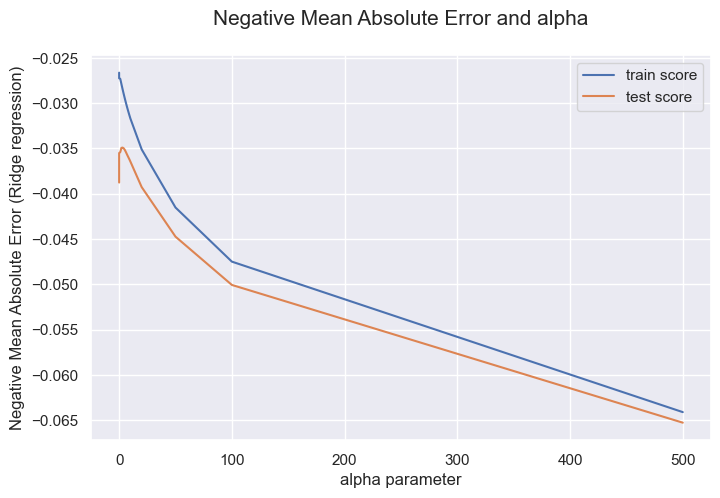

In [631]:
# plotting Negative Mean Absolute Error vs alpha for train and test

ridge_cv_results['param_alpha'] = ridge_cv_results['param_alpha'].astype('int32')

plt.figure(figsize=(8,5))
plt.plot(ridge_cv_results['param_alpha'], ridge_cv_results['mean_train_score'])
plt.plot(ridge_cv_results['param_alpha'], ridge_cv_results['mean_test_score'])
plt.xlabel('alpha parameter')
plt.ylabel('Negative Mean Absolute Error (Ridge regression)')
plt.title("Negative Mean Absolute Error and alpha\n",fontsize=15)
plt.legend(['train score', 'test score'], loc='upper right')
plt.show()

In [632]:
#Fitting Ridge model for alpha = 3 and printing coefficients which have been penalised
alpha = 3
ridge = Ridge(alpha=alpha)

ridge.fit(X_train, y_train)
print(ridge.coef_)

[-3.30543524e-02  3.22368259e-02  6.46501861e-02  1.26713373e-01
  6.89564825e-02  5.15938666e-02  5.70612185e-03  3.79833834e-02
  5.84476804e-02  1.04621228e-01  1.17640218e-03  9.61058426e-03
  3.33580518e-02  2.91224248e-02  3.97056033e-02  5.34945751e-04
  1.52993879e-03  1.19148769e-01  4.12437362e-02  3.98285260e-02
 -5.19282351e-02 -1.42316265e-02 -2.51814921e-02  2.34400991e-02
 -3.40245922e-04  1.25456210e-02 -7.29292993e-04  3.25477833e-03
 -9.89869540e-03  4.56556081e-04  3.60811682e-02 -1.94046528e-02
 -1.45611193e-02  2.53815071e-02 -1.22307693e-02  2.09652285e-03
  4.20690975e-03  5.20011924e-03  1.79025445e-02  1.83441081e-02
 -1.70905111e-02 -1.02224973e-02  3.96496873e-02 -2.75000049e-02
 -2.93477377e-02 -1.82604368e-02 -2.06495492e-02 -2.50975952e-02
 -1.93103102e-02  1.88835236e-02 -1.42203815e-02  2.72740053e-02
  5.20234289e-02 -1.96500834e-02 -2.16053751e-03 -2.03867892e-02
 -4.73790087e-03  1.51615341e-02  8.81683749e-02 -2.75923700e-02
 -1.65292447e-03  1.27876

In [633]:
# Lets calculate some metrics such as R2 score, RSS and RMSE for Ridege model
y_pred_train = ridge.predict(X_train)
y_pred_test = ridge.predict(X_test)

metric2 = []
r2_train_lr = r2_score(y_train, y_pred_train)
print(r2_train_lr)
metric2.append(r2_train_lr)

r2_test_lr = r2_score(y_test, y_pred_test)
print(r2_test_lr)
metric2.append(r2_test_lr)

rss1_lr = np.sum(np.square(y_train - y_pred_train))
print(rss1_lr)
metric2.append(rss1_lr)

rss2_lr = np.sum(np.square(y_test - y_pred_test))
print(rss2_lr)
metric2.append(rss2_lr)

mse_train_lr = mean_squared_error(y_train, y_pred_train)
print(mse_train_lr)
metric2.append(mse_train_lr**0.5)

mse_test_lr = mean_squared_error(y_test, y_pred_test)
print(mse_test_lr)
metric2.append(mse_test_lr**0.5)

0.9243017362743223
0.9059811301422764
1.475845082001414
0.7979218687022089
0.0017362883317663693
0.002186087311512901


In [634]:
house_pricing_ridge = pd.DataFrame({'Features':X_train.columns, 'Coefficient':ridge.coef_.round(4)})
house_pricing_ridge

,Features,Coefficient
0,MSSubClass,-0.0331
1,LotFrontage,0.0322
2,LotArea,0.0647
3,OverallQual,0.1267
4,OverallCond,0.0690
...,...,...
181,SaleCondition_AdjLand,0.0042
182,SaleCondition_Alloca,-0.0015
183,SaleCondition_Family,-0.0088
184,SaleCondition_Normal,0.0149


In [635]:
house_pricing_ridge.reset_index(drop=True, inplace=True)
house_pricing_ridge

,Features,Coefficient
0,MSSubClass,-0.0331
1,LotFrontage,0.0322
2,LotArea,0.0647
3,OverallQual,0.1267
4,OverallCond,0.0690
...,...,...
181,SaleCondition_AdjLand,0.0042
182,SaleCondition_Alloca,-0.0015
183,SaleCondition_Family,-0.0088
184,SaleCondition_Normal,0.0149


Text(0, 0.5, 'Sales Price')

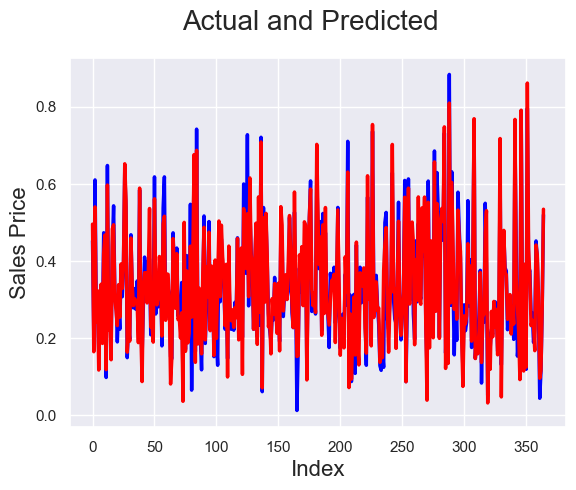

In [719]:
# Simple Linear Regression with 100 features: Actual vs Predicted
c = [i for i in range(0,y_test.shape[0],1)]
fig = plt.figure()
plt.plot(c, y_test, color="blue", linewidth=2.5, linestyle="-")
plt.plot(c, y_testpred, color="red",  linewidth=2.5, linestyle="-")
fig.suptitle('Actual and Predicted', fontsize=20)              # Plot heading 
plt.xlabel('Index', fontsize=16)                               # X-label
plt.ylabel('Sales Price', fontsize=16)     


# LASSO REGRESSION

In [636]:
# Applying Lasso

# list of alphas to tune
params = {'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 
 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 
 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 500, 1000 ]}
lasso = Lasso()

# cross validation
folds = 5
model_cv = GridSearchCV(estimator = lasso, 
                        param_grid = params, 
                        scoring= 'neg_mean_absolute_error', 
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            

model_cv.fit(X_train, y_train) 

Fitting 5 folds for each of 28 candidates, totalling 140 fits


GridSearchCV(cv=5, estimator=Lasso(),
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3,
                                   0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
                                   4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50,
                                   100, 500, 1000]},
             return_train_score=True, scoring='neg_mean_absolute_error',
             verbose=1)

In [637]:
# cv_results
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results = cv_results[cv_results['param_alpha']<=1]
cv_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.087208,0.036057,0.001798,0.002225,0.0001,{'alpha': 0.0001},-0.031634,-0.037921,-0.034640,-0.034219,-0.036681,-0.035019,0.002164,1,-0.029326,-0.027302,-0.028613,-0.028741,-0.027896,-0.028375,0.000703
1,0.018151,0.005065,0.000000,0.000000,0.001,{'alpha': 0.001},-0.038485,-0.041577,-0.040626,-0.038880,-0.039224,-0.039758,0.001161,2,-0.037327,-0.035952,-0.036276,-0.036725,-0.035407,-0.036337,0.000655
2,0.006256,0.007662,0.009373,0.007653,0.01,{'alpha': 0.01},-0.070796,-0.076118,-0.068176,-0.069636,-0.067332,-0.070411,0.003092,3,-0.070121,-0.068081,-0.068807,-0.070080,-0.069480,-0.069314,0.000780
3,0.005535,0.005538,0.004724,0.005767,0.05,{'alpha': 0.05},-0.115109,-0.124171,-0.115994,-0.109164,-0.114436,-0.115775,0.004827,4,-0.115805,-0.113795,-0.115668,-0.117579,-0.115909,-0.115751,0.001200
4,0.009374,0.007654,0.000000,0.000000,0.1,{'alpha': 0.1},-0.115109,-0.124171,-0.115994,-0.109164,-0.114436,-0.115775,0.004827,4,-0.115805,-0.113795,-0.115668,-0.117579,-0.115909,-0.115751,0.001200


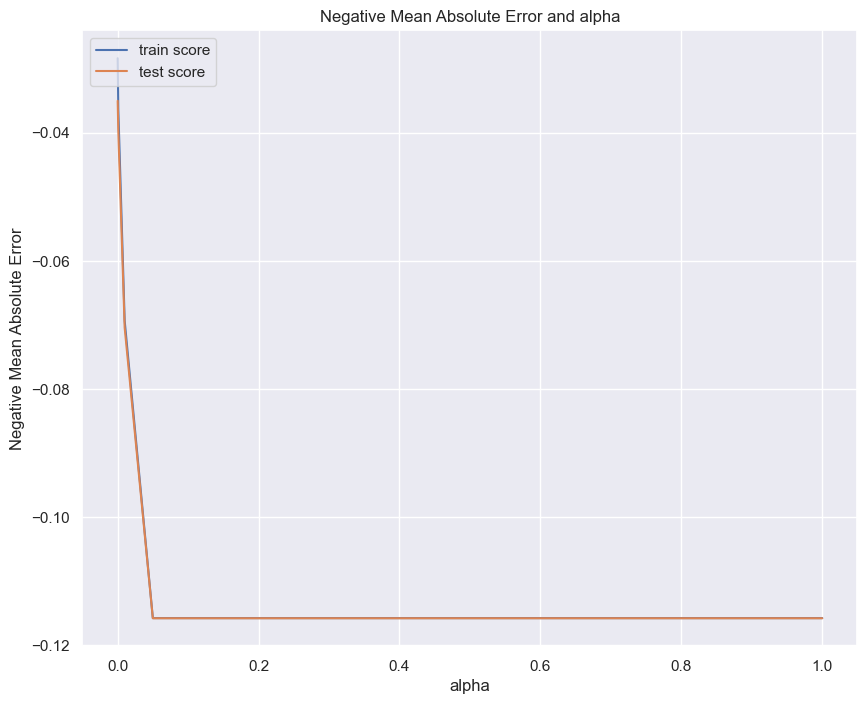

In [638]:
# plotting mean test and train scoes with alpha 
cv_results['param_alpha'] = cv_results['param_alpha'].astype('float32')
plt.figure(figsize=(10,8))
# plotting
plt.plot(cv_results['param_alpha'], cv_results['mean_train_score'])
plt.plot(cv_results['param_alpha'], cv_results['mean_test_score'])
plt.xlabel('alpha')
plt.ylabel('Negative Mean Absolute Error')
plt.title("Negative Mean Absolute Error and alpha")
plt.legend(['train score', 'test score'], loc='upper left')
plt.show()

In [639]:
model_cv.best_estimator_

Lasso(alpha=0.0001)

In [640]:
# At alpha = 0.01, even the smallest of negative coefficients that have some predictive power towards 'SalePrice' have been generated

alpha = 0.0001
lasso = Lasso(alpha=alpha)

lasso.fit(X_train, y_train)
lasso.coef_

array([-3.61324552e-02,  2.44274512e-02,  7.07565189e-02,  1.65480388e-01,
        9.28496458e-02,  1.35651458e-01,  0.00000000e+00,  7.74660088e-02,
        0.00000000e+00,  8.02800090e-02, -0.00000000e+00, -0.00000000e+00,
        2.78280265e-02,  2.30905219e-02,  4.20775635e-02, -0.00000000e+00,
        0.00000000e+00,  1.92012116e-01,  3.24953701e-02,  3.78966931e-02,
       -7.70203184e-03, -7.50622360e-03, -1.88066881e-02,  2.36836012e-02,
        0.00000000e+00,  1.23032406e-02, -0.00000000e+00,  0.00000000e+00,
       -0.00000000e+00,  1.45545696e-03,  3.37061469e-02, -1.22634129e-02,
       -1.10636418e-02,  2.25957899e-02, -6.92903151e-03,  0.00000000e+00,
        4.34613850e-03,  0.00000000e+00,  2.29907582e-02,  3.13592336e-02,
       -0.00000000e+00, -0.00000000e+00,  5.36106592e-02, -1.42903004e-02,
       -1.63009479e-02, -7.40359366e-05, -0.00000000e+00, -1.44802686e-02,
       -5.17264573e-03,  2.99006755e-02, -2.94672319e-03,  3.63006428e-02,
        6.25397169e-02, -

In [641]:
# lasso model parameters
model_parameters = list(lasso.coef_ )
model_parameters.insert(0, lasso.intercept_)
model_parameters = [round(x, 3) for x in model_parameters]
cols = X.columns
cols = cols.insert(0, "constant")
list(zip(cols, model_parameters))

[('constant', -0.102),
 ('MSSubClass', -0.036),
 ('LotFrontage', 0.024),
 ('LotArea', 0.071),
 ('OverallQual', 0.165),
 ('OverallCond', 0.093),
 ('YearBuilt', 0.136),
 ('MasVnrArea', 0.0),
 ('BsmtUnfSF', 0.077),
 ('TotalBsmtSF', 0.0),
 ('GrLivArea', 0.08),
 ('BedroomAbvGr', -0.0),
 ('TotRmsAbvGrd', -0.0),
 ('Fireplaces', 0.028),
 ('GarageCars', 0.023),
 ('GarageArea', 0.042),
 ('MoSold', -0.0),
 ('YrSold', 0.0),
 ('Total_sqr_footage', 0.192),
 ('Total_Bathrooms', 0.032),
 ('Total_porch_sf', 0.038),
 ('Total_Age', -0.008),
 ('Garage_age', -0.008),
 ('Remodel_age', -0.019),
 ('MSZoning_FV', 0.024),
 ('MSZoning_RH', 0.0),
 ('MSZoning_RL', 0.012),
 ('MSZoning_RM', -0.0),
 ('LotShape_IR2', 0.0),
 ('LotShape_IR3', -0.0),
 ('LotShape_Reg', 0.001),
 ('LandContour_HLS', 0.034),
 ('LandContour_Low', -0.012),
 ('LandContour_Lvl', -0.011),
 ('LotConfig_CulDSac', 0.023),
 ('LotConfig_FR2', -0.007),
 ('LotConfig_FR3', 0.0),
 ('LotConfig_Inside', 0.004),
 ('Neighborhood_Blueste', 0.0),
 ('Neighborhoo

In [642]:
# Lets calculate some metrics such as R2 score, RSS and RMSE

y_pred_train = lasso.predict(X_train)
y_pred_test = lasso.predict(X_test)

metric3 = []
r2_train_lr = r2_score(y_train, y_pred_train)
print(r2_train_lr)
metric3.append(r2_train_lr)

r2_test_lr = r2_score(y_test, y_pred_test)
print(r2_test_lr)
metric3.append(r2_test_lr)

rss1_lr = np.sum(np.square(y_train - y_pred_train))
print(rss1_lr)
metric3.append(rss1_lr)

rss2_lr = np.sum(np.square(y_test - y_pred_test))
print(rss2_lr)
metric3.append(rss2_lr)

mse_train_lr = mean_squared_error(y_train, y_pred_train)
print(mse_train_lr)
metric3.append(mse_train_lr**0.5)

mse_test_lr = mean_squared_error(y_test, y_pred_test)
print(mse_test_lr)
metric3.append(mse_test_lr**0.5)

0.9241248183546377
0.9068657096423898
1.4792943479268628
0.7904145956535733
0.0017403462916786622
0.002165519440146776


In [643]:
mod = list(zip(cols, model_parameters))

In [644]:
house_pricing_lasso = pd.DataFrame({'Features':X_train.columns, 'Coefficient':lasso.coef_.round(4)})
house_pricing_lasso.columns = ['Variable', 'Coeff']
house_pricing_lasso.head()

,Variable,Coeff
0,MSSubClass,-0.0361
1,LotFrontage,0.0244
2,LotArea,0.0708
3,OverallQual,0.1655
4,OverallCond,0.0928


In [645]:
# sort the coefficients in ascending order
house_pricing_lasso = house_pricing_lasso.sort_values((['Coeff']), axis = 0, ascending = False)

house_pricing_lasso.sort_values(by='Coeff',ascending=False).head(10)

,Variable,Coeff
17,Total_sqr_footage,0.1920
3,OverallQual,0.1655
5,YearBuilt,0.1357
58,Neighborhood_StoneBr,0.1099
4,OverallCond,0.0928
9,GrLivArea,0.0803
7,BsmtUnfSF,0.0775
2,LotArea,0.0708
52,Neighborhood_NridgHt,0.0625
42,Neighborhood_Crawfor,0.0536


In [646]:
# Chose variables whose coefficients are non-zero
house_pricing_lasso = pd.DataFrame(house_pricing_lasso[(house_pricing_lasso['Coeff'] != 0)])
house_pricing_lasso

,Variable,Coeff
17,Total_sqr_footage,0.1920
3,OverallQual,0.1655
5,YearBuilt,0.1357
58,Neighborhood_StoneBr,0.1099
4,OverallCond,0.0928
...,...,...
0,MSSubClass,-0.0361
156,KitchenQual_Fa,-0.0382
129,BsmtQual_Gd,-0.0401
158,KitchenQual_TA,-0.0438


In [647]:
house_pricing_lasso.shape

(108, 2)

In [648]:
house_pricing_lasso.reset_index(drop=True, inplace=True)
house_pricing_lasso

,Variable,Coeff
0,Total_sqr_footage,0.1920
1,OverallQual,0.1655
2,YearBuilt,0.1357
3,Neighborhood_StoneBr,0.1099
4,OverallCond,0.0928
...,...,...
103,MSSubClass,-0.0361
104,KitchenQual_Fa,-0.0382
105,BsmtQual_Gd,-0.0401
106,KitchenQual_TA,-0.0438


# FInal Model Building With 20 features 

In [649]:
 #RFE : minimising features to 20

# X_train_lasso = X_train[house_pricing_lasso.columns]

lm = LinearRegression()
lm.fit(X_train, y_train)

# running RFE

rfe = RFE(lm, n_features_to_select = 20)            
rfe = rfe.fit(X_train, y_train)

In [650]:
X_train_lasso = X_train[house_pricing_lasso.Variable]

In [651]:
X_train_lasso


,Total_sqr_footage,OverallQual,YearBuilt,Neighborhood_StoneBr,OverallCond,GrLivArea,BsmtUnfSF,LotArea,Neighborhood_NridgHt,Neighborhood_Crawfor,GarageArea,Total_porch_sf,BsmtExposure_Gd,Neighborhood_NoRidge,Condition1_PosN,Exterior1st_BrkFace,LandContour_HLS,Total_Bathrooms,Neighborhood_BrkSide,Exterior2nd_CmentBd,Neighborhood_NPkVill,SaleCondition_Partial,Fireplaces,SaleType_CWD,LotFrontage,MSZoning_FV,Condition1_Norm,GarageCars,Neighborhood_BrDale,Neighborhood_Somerst,LotConfig_CulDSac,Condition1_RRNn,MasVnrType_Stone,Foundation_PConc,SaleCondition_Normal,MSZoning_RL,Condition1_Feedr,BsmtFinType2_Unf,BsmtFinType1_GLQ,BsmtCond_TA,GarageType_Detchd,GarageType_BuiltIn,Exterior1st_MetalSd,MasVnrType_BrkFace,LotConfig_Inside,Neighborhood_SWISU,ExterCond_Fa,GarageType_Attchd,Neighborhood_SawyerW,Exterior2nd_Brk Cmn,...,BsmtExposure_No,BsmtFinType1_Unf,Exterior1st_VinylSd,BsmtFinType1_BLQ,ExterCond_Gd,SaleType_WD,Neighborhood_NWAmes,Exterior1st_Wd Sdng,HouseStyle_1Story,RoofStyle_Gable,BsmtFinType1_Rec,Exterior1st_HdBoard,GarageQual_Fa,Neighborhood_NAmes,HeatingQC_Gd,Neighborhood_OldTown,Exterior2nd_Wd Shng,SaleCondition_Family,Neighborhood_Sawyer,LotConfig_FR2,HeatingQC_TA,Garage_age,Total_Age,BsmtQual_Fa,Exterior2nd_BrkFace,LandContour_Lvl,BldgType_TwnhsE,GarageType_Basment,GarageFinish_Unf,LandContour_Low,ExterQual_Gd,BsmtFinType1_LwQ,GarageFinish_RFn,Neighborhood_Timber,Neighborhood_Edwards,Neighborhood_Mitchel,Neighborhood_Gilbert,Remodel_age,ExterQual_TA,Condition1_PosA,BldgType_Twnhs,Condition1_RRAe,ExterQual_Fa,BldgType_Duplex,BsmtQual_TA,MSSubClass,KitchenQual_Fa,BsmtQual_Gd,KitchenQual_TA,KitchenQual_Gd
1087,0.557123,0.875,0.970803,0.0,0.500,0.738595,0.510137,0.498602,0.0,0.0,0.750360,0.448718,0.0,0.0,0.0,0.0,0.0,0.3,0.0,0.0,0.0,0.0,0.333333,0.0,0.688172,1.0,1.0,0.75,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,...,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.039216,0.029412,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.050000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.235294,0.0,1.0,0.0,1.0
1191,0.380936,0.875,0.927007,0.0,0.500,0.505018,0.365865,0.072312,0.0,0.0,0.353957,0.440171,0.0,0.0,0.0,0.0,0.0,0.3,0.0,0.0,0.0,0.0,0.000000,0.0,0.032258,1.0,1.0,0.50,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,...,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.078431,0.058824,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.116667,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.823529,0.0,1.0,0.0,1.0
1146,0.764625,0.625,0.824818,0.0,0.500,0.439781,0.018859,0.532258,0.0,0.0,0.289928,0.408120,0.0,0.0,0.0,0.0,0.0,0.4,0.0,0.0,0.0,0.0,0.333333,0.0,0.516129,0.0,1.0,0.50,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.205882,0.154412,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.350000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,1.0,0.0,1.0
555,0.245699,0.500,0.364964,0.0,0.625,0.325730,0.468175,0.273118,0.0,0.0,0.201439,0.247863,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.333333,0.0,0.397849,0.0,1.0,0.25,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.823529,0.617647,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.933333,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.147059,0.0,0.0,1.0,0.0
663,0.669993,0.375,0.729927,0.0,0.500,0.386405,0.017916,0.468387,0.0,0.0,0.423022,0.384615,0.0,0.0,0.0,0.0,0.0,0.4,0.0,0.0,0.0,0.0,0.000000,0.0,0.741935,0.0,1.0,0.50,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.333333,0.264706,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.600000,1.0,0.0,0.0,0.0,0.0,0.0,

In [652]:
auto_selected_predictors = X_train.columns[rfe.support_]
auto_selected_predictors

Index(['LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'BsmtUnfSF',
       'GarageArea', 'YrSold', 'Total_sqr_footage', 'Total_Age',
       'Neighborhood_StoneBr', 'Condition1_PosA', 'Condition1_RRNe',
       'Exterior1st_CBlock', 'Exterior2nd_CBlock', 'BsmtQual_none',
       'BsmtCond_none', 'BsmtFinType1_none', 'GarageType_none',
       'GarageFinish_none', 'GarageQual_none'],
      dtype='object')

In [653]:
# RFE : minimising features to 20

X_train_lm = sm.add_constant(X_train[auto_selected_predictors])
    
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

In [654]:
print(lr.params)

const                  -1.839466e-01
LotArea                 1.053518e-01
OverallQual             3.375671e-01
OverallCond             1.285805e-01
YearBuilt              -2.895182e-03
BsmtUnfSF               1.565134e-01
GarageArea              1.307046e-01
YrSold                  5.029521e-04
Total_sqr_footage       3.173184e-01
Total_Age              -1.783103e-01
Neighborhood_StoneBr    1.058499e-01
Condition1_PosA        -1.078458e-01
Condition1_RRNe        -2.920388e-18
Exterior1st_CBlock      1.614908e-02
Exterior2nd_CBlock      1.614908e-02
BsmtQual_none           1.306483e-02
BsmtCond_none           1.306483e-02
BsmtFinType1_none       1.306483e-02
GarageType_none         1.042446e-02
GarageFinish_none       1.042446e-02
GarageQual_none         1.042446e-02
dtype: float64


In [655]:
lr.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.841
Model:                            OLS   Adj. R-squared:                  0.838
Method:                 Least Squares   F-statistic:                     339.3
Date:                Wed, 26 Apr 2023   Prob (F-statistic):          1.38e-322
Time:                        21:38:33   Log-Likelihood:                 1178.9
No. Observations:                 850   AIC:                            -2330.
Df Residuals:                     836   BIC:                            -2263.
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   -0.1839      0.011    -17.372      0.000      -0.205      -0.163
LotArea                  0.1054      0.014      7.593      0.000       0.078       0.133
OverallQual              0.3376      0.021     16.275      0.000       0.297       0.378
OverallCond              0.1286      0.018      7.279      0.000       0.094       0.163
YearBuilt               -0.0029      0.008     -0.344      0.731      -0.019       0.014
BsmtUnfSF                0.1565      0.014     11.439      0.000       0.130       0.183
GarageArea               0.1307      0.023      5.704      0.000       0.086       0.176
YrSold                   0.0005      0.006      0.080      0.936      -0.012       0.013
Total_sqr_footage        0.3173      0.016     19.401      0.000       0.285       0.349
Total_Age               -0.1783      0.009    -20.466      0.000      -0.195      -0.161
Neighborhood_StoneBr     0.1058      0.020      5.311      0.000       0.067       0.145
Condition1_PosA         -0.1078      0.036     -3.022      0.003      -0.178      -0.038
Condition1_RRNe       -2.92e-18   1.04e-17     -0.280      0.779   -2.34e-17    1.75e-17
Exterior1st_CBlock       0.0161      0.031      0.527      0.598      -0.044       0.076
Exterior2nd_CBlock       0.0161      0.031      0.527      0.598      -0.044       0.076
BsmtQual_none            0.0131      0.005      2.861      0.004       0.004       0.022
BsmtCond_none            0.0131      0.005      2.861      0.004       0.004       0.022
BsmtFinType1_none        0.0131      0.005      2.861      0.004       0.004       0.022
GarageType_none          0.0104      0.004      2.787      0.005       0.003       0.018
GarageFinish_none        0.0104      0.004      2.787      0.005       0.003       0.018
GarageQual_none          0.0104      0.004      2.787      0.005       0.003       0.018
==============================================================================
Omnibus:                      177.365   Durbin-Watson:                   2.038
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1021.020
Skew:                           0.813   Prob(JB):                    1.94e-222
Kurtosis:                       8.117   Cond. No.                     1.85e+33
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 7.86e-64. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

In [656]:
vif = pd.DataFrame()
vif['Features'] = X_train[auto_selected_predictors].columns
vif['VIF'] = [variance_inflation_factor(X_train[auto_selected_predictors].values, i) for i in range(X_train[auto_selected_predictors].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif)
    

                Features    VIF
19       GarageQual_none    inf
16     BsmtFinType1_none    inf
18     GarageFinish_none    inf
17       GarageType_none    inf
12    Exterior1st_CBlock    inf
13    Exterior2nd_CBlock    inf
14         BsmtQual_none    inf
15         BsmtCond_none    inf
3              YearBuilt  38.52
8              Total_Age   8.50
6                 YrSold   3.02
1            OverallQual   2.39
5             GarageArea   2.32
7      Total_sqr_footage   2.17
4              BsmtUnfSF   1.84
0                LotArea   1.28
2            OverallCond   1.26
9   Neighborhood_StoneBr   1.06
10       Condition1_PosA   1.02
11       Condition1_RRNe    NaN


In [657]:
lasso_selected_features = []
for k,v in sorted(list(zip(model_parameters,cols)), key=lambda x:abs(x[0]), reverse=True)[1:21]:
    lasso_selected_features.append(v)
sorted(list(zip(model_parameters,cols)), key=lambda x:abs(x[0]), reverse=True)

print(lasso_selected_features)


['OverallQual', 'YearBuilt', 'Neighborhood_StoneBr', 'constant', 'OverallCond', 'GrLivArea', 'BsmtUnfSF', 'LotArea', 'Neighborhood_NridgHt', 'Neighborhood_Crawfor', 'KitchenQual_Gd', 'KitchenQual_TA', 'GarageArea', 'BsmtQual_Gd', 'Total_porch_sf', 'BsmtExposure_Gd', 'KitchenQual_Fa', 'MSSubClass', 'Neighborhood_NoRidge', 'Condition1_PosN']


In [658]:
laso_selt_fr= ['OverallQual',
 'YearBuilt',
 'Neighborhood_StoneBr',
 'OverallCond',
 'GrLivArea',
 'BsmtUnfSF',
 'LotArea',
 'Neighborhood_NridgHt',
 'Neighborhood_Crawfor',
 'KitchenQual_Gd',
 'KitchenQual_TA',
 'GarageArea',
 'BsmtQual_Gd',
 'Total_porch_sf',
 'BsmtExposure_Gd',
 'KitchenQual_Fa',
 'MSSubClass',
 'Neighborhood_NoRidge',
 'Condition1_PosN']

In [659]:

X_train_lm = sm.add_constant(X_train[laso_selt_fr])
    
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

In [660]:
print(lr.params)

const                  -0.159055
OverallQual             0.259882
YearBuilt               0.249544
Neighborhood_StoneBr    0.143733
OverallCond             0.096778
GrLivArea               0.245351
BsmtUnfSF              -0.012330
LotArea                 0.062948
Neighborhood_NridgHt    0.078881
Neighborhood_Crawfor    0.094146
KitchenQual_Gd         -0.080622
KitchenQual_TA         -0.093663
GarageArea              0.116506
BsmtQual_Gd            -0.011717
Total_porch_sf          0.055094
BsmtExposure_Gd         0.062423
KitchenQual_Fa         -0.069760
MSSubClass             -0.072705
Neighborhood_NoRidge    0.063243
Condition1_PosN         0.042879
dtype: float64


In [661]:
vif = pd.DataFrame()
vif['Features'] = X_train[laso_selt_fr].columns
vif['VIF'] = [variance_inflation_factor(X_train[laso_selt_fr].values, i) for i in range(X_train[laso_selt_fr].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif)

                Features    VIF
0            OverallQual  44.60
1              YearBuilt  29.77
3            OverallCond  16.68
4              GrLivArea  16.35
6                LotArea  10.86
11            GarageArea  10.65
10        KitchenQual_TA  10.16
9         KitchenQual_Gd   8.89
5              BsmtUnfSF   3.39
12           BsmtQual_Gd   3.13
13        Total_porch_sf   3.07
16            MSSubClass   2.64
15        KitchenQual_Fa   1.36
7   Neighborhood_NridgHt   1.27
8   Neighborhood_Crawfor   1.16
14       BsmtExposure_Gd   1.13
2   Neighborhood_StoneBr   1.09
17  Neighborhood_NoRidge   1.06
18       Condition1_PosN   1.02


In [662]:
lr.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.870
Model:                            OLS   Adj. R-squared:                  0.867
Method:                 Least Squares   F-statistic:                     292.2
Date:                Wed, 26 Apr 2023   Prob (F-statistic):               0.00
Time:                        21:38:34   Log-Likelihood:                 1265.2
No. Observations:                 850   AIC:                            -2490.
Df Residuals:                     830   BIC:                            -2395.
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   -0.1591      0.023     -6.994      0.000      -0.204      -0.114
OverallQual              0.2599      0.020     12.679      0.000       0.220       0.300
YearBuilt                0.2495      0.015     16.336      0.000       0.220       0.280
Neighborhood_StoneBr     0.1437      0.018      7.878      0.000       0.108       0.180
OverallCond              0.0968      0.017      5.859      0.000       0.064       0.129
GrLivArea                0.2454      0.015     16.326      0.000       0.216       0.275
BsmtUnfSF               -0.0123      0.011     -1.169      0.243      -0.033       0.008
LotArea                  0.0629      0.014      4.382      0.000       0.035       0.091
Neighborhood_NridgHt     0.0789      0.010      7.603      0.000       0.059       0.099
Neighborhood_Crawfor     0.0941      0.011      8.810      0.000       0.073       0.115
KitchenQual_Gd          -0.0806      0.010     -7.779      0.000      -0.101      -0.060
KitchenQual_TA          -0.0937      0.011     -8.558      0.000      -0.115      -0.072
GarageArea               0.1165      0.018      6.569      0.000       0.082       0.151
BsmtQual_Gd             -0.0117      0.005     -2.228      0.026      -0.022      -0.001
Total_porch_sf           0.0551      0.008      6.867      0.000       0.039       0.071
BsmtExposure_Gd          0.0624      0.008      7.815      0.000       0.047       0.078
KitchenQual_Fa          -0.0698      0.017     -4.085      0.000      -0.103      -0.036
MSSubClass              -0.0727      0.009     -8.005      0.000      -0.091      -0.055
Neighborhood_NoRidge     0.0632      0.019      3.321      0.001       0.026       0.101
Condition1_PosN          0.0429      0.025      1.719      0.086      -0.006       0.092
==============================================================================
Omnibus:                      135.397   Durbin-Watson:                   2.034
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              794.374
Skew:                           0.570   Prob(JB):                    3.19e-173
Kurtosis:                       7.597   Cond. No.                         30.7
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

Text(0, 0.5, 'Sales Price')

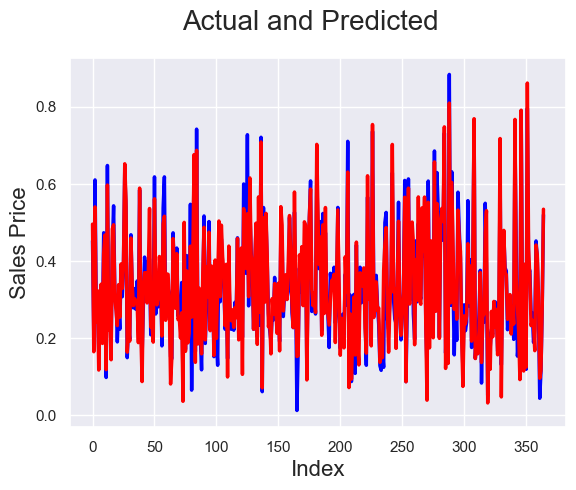

In [663]:
# Simple Linear Regression with 100 features: Actual vs Predicted
c = [i for i in range(0,y_test.shape[0],1)]
fig = plt.figure()
plt.plot(c, y_test, color="blue", linewidth=2.5, linestyle="-")
plt.plot(c, y_testpred, color="red",  linewidth=2.5, linestyle="-")
fig.suptitle('Actual and Predicted', fontsize=20)              # Plot heading 
plt.xlabel('Index', fontsize=16)                               # X-label
plt.ylabel('Sales Price', fontsize=16)     


In [664]:
train_lasso = ['OverallQual',
 'YearBuilt',
 'Neighborhood_StoneBr',
 'OverallCond',
 'GrLivArea',
 'LotArea',
 'Neighborhood_NridgHt',
 'Neighborhood_Crawfor',
 'KitchenQual_Gd',
 'KitchenQual_TA',
 'GarageArea',
 'BsmtQual_Gd',
 'Total_porch_sf',
 'BsmtExposure_Gd',
 'KitchenQual_Fa',
 'MSSubClass',
 'Neighborhood_NoRidge',
 'Condition1_PosN']

In [665]:
X_train_lm = sm.add_constant(X_train[train_lasso])
    
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

In [666]:
vif = pd.DataFrame()
vif['Features'] = X_train[train_lasso].columns
vif['VIF'] = [variance_inflation_factor(X_train[train_lasso].values, i) for i in range(X_train[train_lasso].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif)

                Features    VIF
0            OverallQual  42.17
1              YearBuilt  29.56
3            OverallCond  16.64
4              GrLivArea  15.94
5                LotArea  10.82
10            GarageArea  10.60
9         KitchenQual_TA  10.12
8         KitchenQual_Gd   8.86
11           BsmtQual_Gd   3.13
12        Total_porch_sf   3.04
15            MSSubClass   2.53
14        KitchenQual_Fa   1.35
6   Neighborhood_NridgHt   1.24
7   Neighborhood_Crawfor   1.16
13       BsmtExposure_Gd   1.12
2   Neighborhood_StoneBr   1.09
16  Neighborhood_NoRidge   1.06
17       Condition1_PosN   1.02


In [667]:
lr.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.870
Model:                            OLS   Adj. R-squared:                  0.867
Method:                 Least Squares   F-statistic:                     308.2
Date:                Wed, 26 Apr 2023   Prob (F-statistic):               0.00
Time:                        21:38:34   Log-Likelihood:                 1264.5
No. Observations:                 850   AIC:                            -2491.
Df Residuals:                     831   BIC:                            -2401.
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   -0.1622      0.023     -7.178      0.000      -0.207      -0.118
OverallQual              0.2552      0.020     12.690      0.000       0.216       0.295
YearBuilt                0.2518      0.015     16.613      0.000       0.222       0.282
Neighborhood_StoneBr     0.1444      0.018      7.917      0.000       0.109       0.180
OverallCond              0.0989      0.016      6.025      0.000       0.067       0.131
GrLivArea                0.2429      0.015     16.321      0.000       0.214       0.272
LotArea                  0.0643      0.014      4.489      0.000       0.036       0.092
Neighborhood_NridgHt     0.0772      0.010      7.512      0.000       0.057       0.097
Neighborhood_Crawfor     0.0948      0.011      8.879      0.000       0.074       0.116
KitchenQual_Gd          -0.0806      0.010     -7.772      0.000      -0.101      -0.060
KitchenQual_TA          -0.0932      0.011     -8.521      0.000      -0.115      -0.072
GarageArea               0.1152      0.018      6.506      0.000       0.080       0.150
BsmtQual_Gd             -0.0121      0.005     -2.300      0.022      -0.022      -0.002
Total_porch_sf           0.0561      0.008      7.025      0.000       0.040       0.072
BsmtExposure_Gd          0.0633      0.008      7.955      0.000       0.048       0.079
KitchenQual_Fa          -0.0697      0.017     -4.080      0.000      -0.103      -0.036
MSSubClass              -0.0703      0.009     -7.942      0.000      -0.088      -0.053
Neighborhood_NoRidge     0.0647      0.019      3.403      0.001       0.027       0.102
Condition1_PosN          0.0431      0.025      1.729      0.084      -0.006       0.092
==============================================================================
Omnibus:                      134.920   Durbin-Watson:                   2.024
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              805.337
Skew:                           0.561   Prob(JB):                    1.33e-175
Kurtosis:                       7.635   Cond. No.                         30.3
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [668]:
cor = house_df[train_lasso].corr()
cor

,OverallQual,YearBuilt,Neighborhood_StoneBr,OverallCond,GrLivArea,LotArea,Neighborhood_NridgHt,Neighborhood_Crawfor,KitchenQual_Gd,KitchenQual_TA,GarageArea,BsmtQual_Gd,Total_porch_sf,BsmtExposure_Gd,KitchenQual_Fa,MSSubClass,Neighborhood_NoRidge,Condition1_PosN
OverallQual,1.000000,0.594875,0.193504,-0.097966,0.543447,0.131182,0.289348,0.039438,0.484565,-0.530733,0.511803,0.442067,0.278815,0.136708,-0.203343,0.075704,0.107699,0.019472
YearBuilt,0.594875,1.000000,0.096436,-0.355461,0.227345,0.064544,0.233484,-0.181118,0.494610,-0.460035,0.503504,0.628319,0.112694,0.136514,-0.228988,0.064099,0.081585,-0.013268
Neighborhood_StoneBr,0.193504,0.096436,1.000000,-0.054457,0.068456,-0.076607,-0.023173,-0.021314,0.084097,-0.123903,0.077601,0.090632,0.093398,0.029219,-0.020186,0.112688,-0.011042,-0.010523
OverallCond,-0.097966,-0.355461,-0.054457,1.000000,-0.146237,-0.032344,-0.106018,0.155285,-0.030998,0.058647,-0.138908,-0.233550,0.007811,-0.044904,-0.056882,-0.078614,-0.034642,-0.014861
GrLivArea,0.543447,0.227345,0.068456,-0.146237,1.000000,0.333815,0.166035,0.104653,0.293798,-0.325060,0.384753,0.221586,0.255228,0.034486,-0.086005,0.101355,0.164448,0.061337
LotArea,0.131182,0.064544,-0.076607,-0.032344,0.333815,1.000000,0.030922,0.096474,-0.001598,-0.022265,0.272516,0.008599,0.158758,0.089338,-0.035275,-0.460474,0.092337,0.029309
Neighborhood_NridgHt,0.289348,0.233484,-0.023173,-0.106018,0.166035,0.030922,1.000000,-0.037012,0.126384,-0.215159,0.255378,0.052149,0.088587,0.035411,-0.035053,0.070113,-0.019174,-0.018274
Neighborhood_Crawfor,0.039438,-0.181118,-0.021314,0.155285,0.104653,0.096474,-0.037012,1.000000,0.021053,-0.031435,-0.063126,-0.055875,-0.008418,0.008804,0.049369,0.014590,-0.017636,0.034246
KitchenQual_Gd,0.484565,0.494610,0.084097,-0.030998,0.293798,-0.001598,0.126384,0.021053,1.000000,-0.865289,0.342047,0.465340,0.183431,0.045926,-0.140969,0.040025,0.082920,0.001074
KitchenQual_TA,-0.530733,-0.460035,-0.123903,0.058647,-0.325060,-0.022265,-0.215159,-0.031435,-0.865289,1.000000,-0.345680,-0.404105,-0.193592,-0.069040,-0.187425,-0.039589,-0.067679,-0.006389


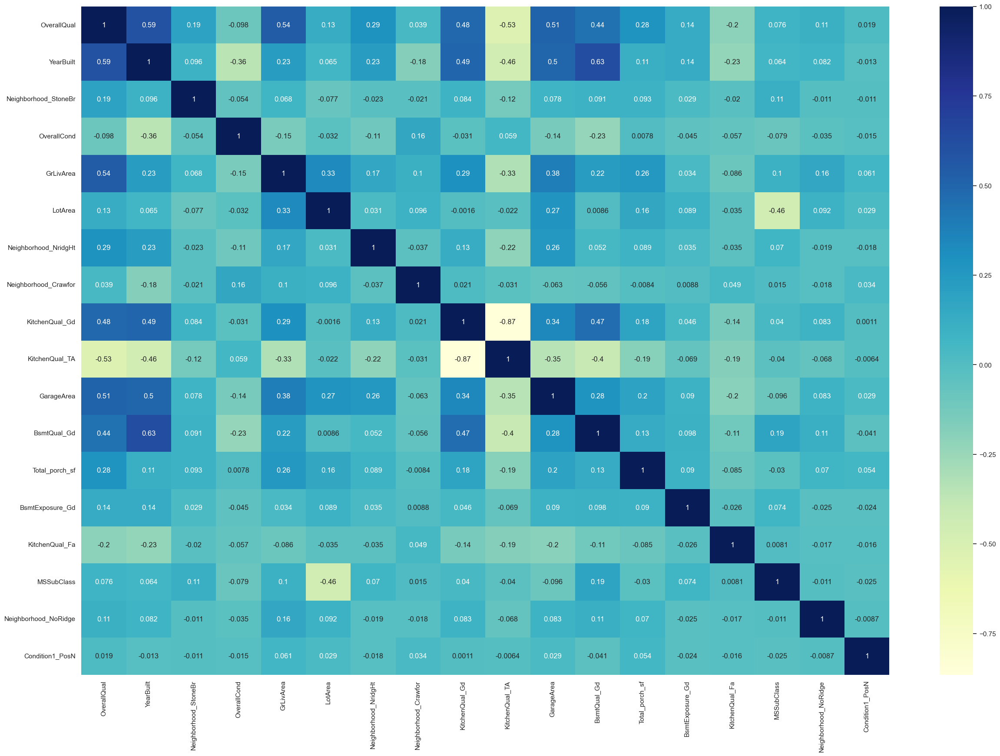

In [669]:
plt.figure(figsize=(30,20))

# heatmap
sns.heatmap(cor, cmap="YlGnBu", annot=True)
plt.show()

In [670]:
train_lasso_1= ['OverallQual',
 'YearBuilt',
 'Neighborhood_StoneBr',
 'OverallCond',
 'GrLivArea',
 'LotArea',
 'Neighborhood_NridgHt',
 'Neighborhood_Crawfor',
 'KitchenQual_Gd',
 'KitchenQual_TA',
 'GarageArea',
 'BsmtQual_Gd',
 'Total_porch_sf',
 'BsmtExposure_Gd',
 'KitchenQual_Fa',
 'MSSubClass',
 'Neighborhood_NoRidge']

In [671]:
X_train_lm = sm.add_constant(X_train[train_lasso_1])
    
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

In [672]:
vif = pd.DataFrame()
vif['Features'] = X_train[train_lasso_1].columns
vif['VIF'] = [variance_inflation_factor(X_train[train_lasso_1].values, i) for i in range(X_train[train_lasso_1].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif)

                Features    VIF
0            OverallQual  42.16
1              YearBuilt  29.54
3            OverallCond  16.63
4              GrLivArea  15.86
5                LotArea  10.82
10            GarageArea  10.60
9         KitchenQual_TA  10.12
8         KitchenQual_Gd   8.85
11           BsmtQual_Gd   3.13
12        Total_porch_sf   3.04
15            MSSubClass   2.53
14        KitchenQual_Fa   1.35
6   Neighborhood_NridgHt   1.24
7   Neighborhood_Crawfor   1.15
13       BsmtExposure_Gd   1.12
2   Neighborhood_StoneBr   1.09
16  Neighborhood_NoRidge   1.06


In [673]:
lr.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.869
Model:                            OLS   Adj. R-squared:                  0.867
Method:                 Least Squares   F-statistic:                     325.4
Date:                Wed, 26 Apr 2023   Prob (F-statistic):               0.00
Time:                        21:38:37   Log-Likelihood:                 1263.0
No. Observations:                 850   AIC:                            -2490.
Df Residuals:                     832   BIC:                            -2404.
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   -0.1614      0.023     -7.136      0.000      -0.206      -0.117
OverallQual              0.2546      0.020     12.645      0.000       0.215       0.294
YearBuilt                0.2510      0.015     16.548      0.000       0.221       0.281
Neighborhood_StoneBr     0.1442      0.018      7.898      0.000       0.108       0.180
OverallCond              0.0983      0.016      5.981      0.000       0.066       0.131
GrLivArea                0.2446      0.015     16.460      0.000       0.215       0.274
LotArea                  0.0645      0.014      4.501      0.000       0.036       0.093
Neighborhood_NridgHt     0.0769      0.010      7.477      0.000       0.057       0.097
Neighborhood_Crawfor     0.0942      0.011      8.816      0.000       0.073       0.115
KitchenQual_Gd          -0.0801      0.010     -7.725      0.000      -0.101      -0.060
KitchenQual_TA          -0.0932      0.011     -8.510      0.000      -0.115      -0.072
GarageArea               0.1146      0.018      6.469      0.000       0.080       0.149
BsmtQual_Gd             -0.0121      0.005     -2.297      0.022      -0.022      -0.002
Total_porch_sf           0.0560      0.008      7.009      0.000       0.040       0.072
BsmtExposure_Gd          0.0631      0.008      7.927      0.000       0.047       0.079
KitchenQual_Fa          -0.0700      0.017     -4.096      0.000      -0.104      -0.036
MSSubClass              -0.0706      0.009     -7.957      0.000      -0.088      -0.053
Neighborhood_NoRidge     0.0639      0.019      3.361      0.001       0.027       0.101
==============================================================================
Omnibus:                      133.808   Durbin-Watson:                   2.034
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              794.287
Skew:                           0.556   Prob(JB):                    3.33e-173
Kurtosis:                       7.603   Cond. No.                         30.3
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [674]:
laso_selt_fr1= ['YearBuilt',
 'Neighborhood_StoneBr',
 'OverallCond',
 'GrLivArea',
 'LotArea',
 'Neighborhood_NridgHt',
 'Neighborhood_Crawfor',
 'KitchenQual_Gd',
 'KitchenQual_TA',
 'GarageArea',
 'BsmtQual_Gd',
 'Total_porch_sf',
 'BsmtExposure_Gd',
 'KitchenQual_Fa',
 'MSSubClass',
 'Neighborhood_NoRidge']

In [675]:
X_train_lm = sm.add_constant(X_train[laso_selt_fr1])
    
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

In [676]:
vif = pd.DataFrame()
vif['Features'] = X_train[laso_selt_fr1].columns
vif['VIF'] = [variance_inflation_factor(X_train[laso_selt_fr1].values, i) for i in range(X_train[laso_selt_fr1].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif)

                Features    VIF
0              YearBuilt  21.24
2            OverallCond  14.28
3              GrLivArea  12.29
4                LotArea  10.81
9             GarageArea  10.47
8         KitchenQual_TA  10.03
7         KitchenQual_Gd   8.84
10           BsmtQual_Gd   3.12
11        Total_porch_sf   2.99
14            MSSubClass   2.53
13        KitchenQual_Fa   1.35
5   Neighborhood_NridgHt   1.23
6   Neighborhood_Crawfor   1.14
12       BsmtExposure_Gd   1.11
1   Neighborhood_StoneBr   1.06
15  Neighborhood_NoRidge   1.06


In [677]:
lr.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.844
Model:                            OLS   Adj. R-squared:                  0.841
Method:                 Least Squares   F-statistic:                     282.0
Date:                Wed, 26 Apr 2023   Prob (F-statistic):          8.40e-323
Time:                        21:38:37   Log-Likelihood:                 1188.3
No. Observations:                 850   AIC:                            -2343.
Df Residuals:                     833   BIC:                            -2262.
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   -0.0791      0.024     -3.347      0.001      -0.125      -0.033
YearBuilt                0.3149      0.016     20.181      0.000       0.284       0.346
Neighborhood_StoneBr     0.1761      0.020      8.921      0.000       0.137       0.215
OverallCond              0.1221      0.018      6.854      0.000       0.087       0.157
GrLivArea                0.3214      0.015     21.708      0.000       0.292       0.350
LotArea                  0.0504      0.016      3.233      0.001       0.020       0.081
Neighborhood_NridgHt     0.0903      0.011      8.086      0.000       0.068       0.112
Neighborhood_Crawfor     0.1092      0.012      9.422      0.000       0.086       0.132
KitchenQual_Gd          -0.1028      0.011     -9.213      0.000      -0.125      -0.081
KitchenQual_TA          -0.1290      0.012    -11.174      0.000      -0.152      -0.106
GarageArea               0.1365      0.019      7.092      0.000       0.099       0.174
BsmtQual_Gd             -0.0073      0.006     -1.273      0.204      -0.019       0.004
Total_porch_sf           0.0675      0.009      7.786      0.000       0.050       0.084
BsmtExposure_Gd          0.0675      0.009      7.769      0.000       0.050       0.084
KitchenQual_Fa          -0.1174      0.018     -6.448      0.000      -0.153      -0.082
MSSubClass              -0.0741      0.010     -7.660      0.000      -0.093      -0.055
Neighborhood_NoRidge     0.0667      0.021      3.213      0.001       0.026       0.107
==============================================================================
Omnibus:                      141.878   Durbin-Watson:                   2.009
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              702.902
Skew:                           0.663   Prob(JB):                    2.33e-153
Kurtosis:                       7.253   Cond. No.                         28.0
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [678]:
laso_selt_fr2= ['YearBuilt',
 'Neighborhood_StoneBr',
 'OverallCond',
 'GrLivArea',
 'LotArea',
 'Neighborhood_NridgHt',
 'Neighborhood_Crawfor',
 'KitchenQual_Gd',
 'KitchenQual_TA',
 'GarageArea',
 'Total_porch_sf',
 'BsmtExposure_Gd',
 'KitchenQual_Fa',
 'MSSubClass',
 'Neighborhood_NoRidge']

In [679]:
X_train_lm = sm.add_constant(X_train[laso_selt_fr2])
    
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

In [680]:
vif = pd.DataFrame()
vif['Features'] = X_train[laso_selt_fr2].columns
vif['VIF'] = [variance_inflation_factor(X_train[laso_selt_fr2].values, i) for i in range(X_train[laso_selt_fr2].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif)

                Features    VIF
0              YearBuilt  17.37
2            OverallCond  13.44
3              GrLivArea  12.29
4                LotArea  10.81
9             GarageArea  10.45
8         KitchenQual_TA  10.00
7         KitchenQual_Gd   8.74
10        Total_porch_sf   2.98
13            MSSubClass   2.48
12        KitchenQual_Fa   1.35
5   Neighborhood_NridgHt   1.21
6   Neighborhood_Crawfor   1.14
11       BsmtExposure_Gd   1.11
1   Neighborhood_StoneBr   1.06
14  Neighborhood_NoRidge   1.05


In [681]:
lr.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.844
Model:                            OLS   Adj. R-squared:                  0.841
Method:                 Least Squares   F-statistic:                     300.4
Date:                Wed, 26 Apr 2023   Prob (F-statistic):          9.88e-324
Time:                        21:38:37   Log-Likelihood:                 1187.4
No. Observations:                 850   AIC:                            -2343.
Df Residuals:                     834   BIC:                            -2267.
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   -0.0741      0.023     -3.179      0.002      -0.120      -0.028
YearBuilt                0.3062      0.014     21.820      0.000       0.279       0.334
Neighborhood_StoneBr     0.1764      0.020      8.937      0.000       0.138       0.215
OverallCond              0.1236      0.018      6.955      0.000       0.089       0.159
GrLivArea                0.3207      0.015     21.668      0.000       0.292       0.350
LotArea                  0.0496      0.016      3.183      0.002       0.019       0.080
Neighborhood_NridgHt     0.0918      0.011      8.259      0.000       0.070       0.114
Neighborhood_Crawfor     0.1086      0.012      9.375      0.000       0.086       0.131
KitchenQual_Gd          -0.1052      0.011     -9.563      0.000      -0.127      -0.084
KitchenQual_TA          -0.1300      0.012    -11.274      0.000      -0.153      -0.107
GarageArea               0.1373      0.019      7.134      0.000       0.100       0.175
Total_porch_sf           0.0666      0.009      7.709      0.000       0.050       0.084
BsmtExposure_Gd          0.0672      0.009      7.742      0.000       0.050       0.084
KitchenQual_Fa          -0.1193      0.018     -6.574      0.000      -0.155      -0.084
MSSubClass              -0.0762      0.010     -7.998      0.000      -0.095      -0.058
Neighborhood_NoRidge     0.0651      0.021      3.139      0.002       0.024       0.106
==============================================================================
Omnibus:                      150.069   Durbin-Watson:                   2.012
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              752.939
Skew:                           0.705   Prob(JB):                    3.17e-164
Kurtosis:                       7.390   Cond. No.                         26.7
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [682]:
laso_selt_fr3= [
 'Neighborhood_StoneBr',
 'OverallCond',
 'GrLivArea',
 'LotArea',
 'Neighborhood_NridgHt',
 'Neighborhood_Crawfor',
 'KitchenQual_Gd',
 'KitchenQual_TA',
 'GarageArea',
 'Total_porch_sf',
 'BsmtExposure_Gd',
 'KitchenQual_Fa',
 'MSSubClass',
 'Neighborhood_NoRidge']

In [683]:
X_train_lm = sm.add_constant(X_train[laso_selt_fr3])
    
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

In [684]:
vif = pd.DataFrame()
vif['Features'] = X_train[laso_selt_fr2].columns
vif['VIF'] = [variance_inflation_factor(X_train[laso_selt_fr2].values, i) for i in range(X_train[laso_selt_fr2].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif)

                Features    VIF
0              YearBuilt  17.37
2            OverallCond  13.44
3              GrLivArea  12.29
4                LotArea  10.81
9             GarageArea  10.45
8         KitchenQual_TA  10.00
7         KitchenQual_Gd   8.74
10        Total_porch_sf   2.98
13            MSSubClass   2.48
12        KitchenQual_Fa   1.35
5   Neighborhood_NridgHt   1.21
6   Neighborhood_Crawfor   1.14
11       BsmtExposure_Gd   1.11
1   Neighborhood_StoneBr   1.06
14  Neighborhood_NoRidge   1.05


In [685]:
lr.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.755
Model:                            OLS   Adj. R-squared:                  0.751
Method:                 Least Squares   F-statistic:                     183.5
Date:                Wed, 26 Apr 2023   Prob (F-statistic):          2.34e-243
Time:                        21:38:37   Log-Likelihood:                 995.49
No. Observations:                 850   AIC:                            -1961.
Df Residuals:                     835   BIC:                            -1890.
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    0.2202      0.024      9.243      0.000       0.173       0.267
Neighborhood_StoneBr     0.1799      0.025      7.273      0.000       0.131       0.228
OverallCond             -0.0275      0.021     -1.341      0.180      -0.068       0.013
GrLivArea                0.2807      0.018     15.260      0.000       0.245       0.317
LotArea                  0.0543      0.020      2.778      0.006       0.016       0.093
Neighborhood_NridgHt     0.1075      0.014      7.744      0.000       0.080       0.135
Neighborhood_Crawfor     0.0619      0.014      4.343      0.000       0.034       0.090
KitchenQual_Gd          -0.0856      0.014     -6.233      0.000      -0.113      -0.059
KitchenQual_TA          -0.1660      0.014    -11.615      0.000      -0.194      -0.138
GarageArea               0.2707      0.023     11.847      0.000       0.226       0.316
Total_porch_sf           0.0613      0.011      5.661      0.000       0.040       0.082
BsmtExposure_Gd          0.0873      0.011      8.074      0.000       0.066       0.109
KitchenQual_Fa          -0.2110      0.022     -9.540      0.000      -0.254      -0.168
MSSubClass              -0.0585      0.012     -4.922      0.000      -0.082      -0.035
Neighborhood_NoRidge     0.0915      0.026      3.532      0.000       0.041       0.142
==============================================================================
Omnibus:                       60.484   Durbin-Watson:                   1.940
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              264.944
Skew:                           0.090   Prob(JB):                     2.94e-58
Kurtosis:                       5.729   Cond. No.                         21.4
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [686]:
laso_selt_fr4= [
 'Neighborhood_StoneBr',
 'GrLivArea',
 'LotArea',
 'Neighborhood_NridgHt',
 'Neighborhood_Crawfor',
 'KitchenQual_Gd',
 'KitchenQual_TA',
 'GarageArea',
 'Total_porch_sf',
 'BsmtExposure_Gd',
 'KitchenQual_Fa',
 'MSSubClass',
 'Neighborhood_NoRidge']

In [687]:
X_train_lm = sm.add_constant(X_train[laso_selt_fr4])
    
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

In [688]:
vif = pd.DataFrame()
vif['Features'] = X_train[laso_selt_fr4].columns
vif['VIF'] = [variance_inflation_factor(X_train[laso_selt_fr4].values, i) for i in range(X_train[laso_selt_fr4].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif)

                Features    VIF
1              GrLivArea  12.20
2                LotArea  10.34
7             GarageArea   8.36
6         KitchenQual_TA   5.40
5         KitchenQual_Gd   4.86
8         Total_porch_sf   2.94
11            MSSubClass   2.36
3   Neighborhood_NridgHt   1.20
10        KitchenQual_Fa   1.18
9        BsmtExposure_Gd   1.10
4   Neighborhood_Crawfor   1.08
0   Neighborhood_StoneBr   1.06
12  Neighborhood_NoRidge   1.05


In [689]:
lr.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.754
Model:                            OLS   Adj. R-squared:                  0.750
Method:                 Least Squares   F-statistic:                     197.3
Date:                Wed, 26 Apr 2023   Prob (F-statistic):          4.00e-244
Time:                        21:38:37   Log-Likelihood:                 994.57
No. Observations:                 850   AIC:                            -1961.
Df Residuals:                     836   BIC:                            -1895.
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    0.2005      0.019     10.691      0.000       0.164       0.237
Neighborhood_StoneBr     0.1812      0.025      7.331      0.000       0.133       0.230
GrLivArea                0.2839      0.018     15.551      0.000       0.248       0.320
LotArea                  0.0545      0.020      2.790      0.005       0.016       0.093
Neighborhood_NridgHt     0.1089      0.014      7.860      0.000       0.082       0.136
Neighborhood_Crawfor     0.0594      0.014      4.201      0.000       0.032       0.087
KitchenQual_Gd          -0.0846      0.014     -6.167      0.000      -0.111      -0.058
KitchenQual_TA          -0.1647      0.014    -11.546      0.000      -0.193      -0.137
GarageArea               0.2740      0.023     12.051      0.000       0.229       0.319
Total_porch_sf           0.0605      0.011      5.595      0.000       0.039       0.082
BsmtExposure_Gd          0.0879      0.011      8.123      0.000       0.067       0.109
KitchenQual_Fa          -0.2074      0.022     -9.443      0.000      -0.250      -0.164
MSSubClass              -0.0571      0.012     -4.819      0.000      -0.080      -0.034
Neighborhood_NoRidge     0.0919      0.026      3.544      0.000       0.041       0.143
==============================================================================
Omnibus:                       60.614   Durbin-Watson:                   1.937
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              265.203
Skew:                           0.094   Prob(JB):                     2.58e-58
Kurtosis:                       5.730   Cond. No.                         18.1
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [690]:
laso_selt_fr5= [
 'Neighborhood_StoneBr',
 'GrLivArea',
 'Neighborhood_NridgHt',
 'Neighborhood_Crawfor',
 'KitchenQual_Gd',
 'KitchenQual_TA',
 'GarageArea',
 'Total_porch_sf',
 'BsmtExposure_Gd',
 'KitchenQual_Fa',
 'MSSubClass',
 'Neighborhood_NoRidge']

In [691]:
X_train_lm = sm.add_constant(X_train[laso_selt_fr5])
    
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

In [692]:
vif = pd.DataFrame()
vif['Features'] = X_train[laso_selt_fr5].columns
vif['VIF'] = [variance_inflation_factor(X_train[laso_selt_fr5].values, i) for i in range(X_train[laso_selt_fr5].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif)

                Features   VIF
1              GrLivArea  9.96
6             GarageArea  7.81
4         KitchenQual_Gd  4.62
5         KitchenQual_TA  4.36
7         Total_porch_sf  2.90
10            MSSubClass  1.81
2   Neighborhood_NridgHt  1.20
9         KitchenQual_Fa  1.10
8        BsmtExposure_Gd  1.09
3   Neighborhood_Crawfor  1.07
0   Neighborhood_StoneBr  1.05
11  Neighborhood_NoRidge  1.05


In [693]:
lr.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.752
Model:                            OLS   Adj. R-squared:                  0.748
Method:                 Least Squares   F-statistic:                     211.3
Date:                Wed, 26 Apr 2023   Prob (F-statistic):          1.28e-243
Time:                        21:38:37   Log-Likelihood:                 990.63
No. Observations:                 850   AIC:                            -1955.
Df Residuals:                     837   BIC:                            -1894.
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    0.2143      0.018     11.804      0.000       0.179       0.250
Neighborhood_StoneBr     0.1776      0.025      7.166      0.000       0.129       0.226
GrLivArea                0.3008      0.017     17.401      0.000       0.267       0.335
Neighborhood_NridgHt     0.1086      0.014      7.805      0.000       0.081       0.136
Neighborhood_Crawfor     0.0640      0.014      4.538      0.000       0.036       0.092
KitchenQual_Gd          -0.0866      0.014     -6.297      0.000      -0.114      -0.060
KitchenQual_TA          -0.1636      0.014    -11.427      0.000      -0.192      -0.136
GarageArea               0.2835      0.023     12.565      0.000       0.239       0.328
Total_porch_sf           0.0632      0.011      5.842      0.000       0.042       0.084
BsmtExposure_Gd          0.0906      0.011      8.374      0.000       0.069       0.112
KitchenQual_Fa          -0.2048      0.022     -9.298      0.000      -0.248      -0.162
MSSubClass              -0.0740      0.010     -7.241      0.000      -0.094      -0.054
Neighborhood_NoRidge     0.0937      0.026      3.600      0.000       0.043       0.145
==============================================================================
Omnibus:                       56.363   Durbin-Watson:                   1.942
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              233.389
Skew:                           0.068   Prob(JB):                     2.09e-51
Kurtosis:                       5.564   Cond. No.                         17.4
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [694]:
laso_selt_fr6= [
 'Neighborhood_StoneBr',
 'Neighborhood_NridgHt',
 'Neighborhood_Crawfor',
 'KitchenQual_Gd',
 'KitchenQual_TA',
 'GarageArea',
 'Total_porch_sf',
 'BsmtExposure_Gd',
 'KitchenQual_Fa',
 'MSSubClass',
 'Neighborhood_NoRidge']

In [695]:
X_train_lm = sm.add_constant(X_train[laso_selt_fr6])
    
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

In [696]:
vif = pd.DataFrame()
vif['Features'] = X_train[laso_selt_fr6].columns
vif['VIF'] = [variance_inflation_factor(X_train[laso_selt_fr6].values, i) for i in range(X_train[laso_selt_fr6].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif)

                Features   VIF
5             GarageArea  6.06
3         KitchenQual_Gd  4.00
4         KitchenQual_TA  3.61
6         Total_porch_sf  2.70
9             MSSubClass  1.76
1   Neighborhood_NridgHt  1.19
7        BsmtExposure_Gd  1.09
8         KitchenQual_Fa  1.06
0   Neighborhood_StoneBr  1.05
2   Neighborhood_Crawfor  1.04
10  Neighborhood_NoRidge  1.03


In [697]:
lr.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.662
Model:                            OLS   Adj. R-squared:                  0.658
Method:                 Least Squares   F-statistic:                     149.3
Date:                Wed, 26 Apr 2023   Prob (F-statistic):          7.11e-189
Time:                        21:38:38   Log-Likelihood:                 859.41
No. Observations:                 850   AIC:                            -1695.
Df Residuals:                     838   BIC:                            -1638.
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    0.3336      0.020     17.011      0.000       0.295       0.372
Neighborhood_StoneBr     0.1754      0.029      6.068      0.000       0.119       0.232
Neighborhood_NridgHt     0.1164      0.016      7.178      0.000       0.085       0.148
Neighborhood_Crawfor     0.0958      0.016      5.874      0.000       0.064       0.128
KitchenQual_Gd          -0.1027      0.016     -6.416      0.000      -0.134      -0.071
KitchenQual_TA          -0.1948      0.017    -11.757      0.000      -0.227      -0.162
GarageArea               0.3866      0.025     15.226      0.000       0.337       0.436
Total_porch_sf           0.0977      0.012      7.886      0.000       0.073       0.122
BsmtExposure_Gd          0.0834      0.013      6.620      0.000       0.059       0.108
KitchenQual_Fa          -0.2472      0.026     -9.680      0.000      -0.297      -0.197
MSSubClass              -0.0546      0.012     -4.611      0.000      -0.078      -0.031
Neighborhood_NoRidge     0.1607      0.030      5.354      0.000       0.102       0.220
==============================================================================
Omnibus:                       35.057   Durbin-Watson:                   1.994
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               88.778
Skew:                           0.146   Prob(JB):                     5.27e-20
Kurtosis:                       4.556   Cond. No.                         16.1
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [698]:
laso_selt_fr7= [
 'Neighborhood_StoneBr',
 'Neighborhood_NridgHt',
 'Neighborhood_Crawfor',
 'KitchenQual_Gd',
 'KitchenQual_TA',
 'Total_porch_sf',
 'BsmtExposure_Gd',
 'KitchenQual_Fa',
 'MSSubClass',
 'Neighborhood_NoRidge']

In [699]:
X_train_lm = sm.add_constant(X_train[laso_selt_fr7])
    
    # Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

In [700]:
vif = pd.DataFrame()
vif['Features'] = X_train[laso_selt_fr7].columns
vif['VIF'] = [variance_inflation_factor(X_train[laso_selt_fr7].values, i) for i in range(X_train[laso_selt_fr7].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif)

               Features   VIF
5        Total_porch_sf  2.56
3        KitchenQual_Gd  2.12
4        KitchenQual_TA  2.09
8            MSSubClass  1.76
1  Neighborhood_NridgHt  1.10
6       BsmtExposure_Gd  1.08
0  Neighborhood_StoneBr  1.04
2  Neighborhood_Crawfor  1.04
7        KitchenQual_Fa  1.03
9  Neighborhood_NoRidge  1.03


In [701]:
lr.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.569
Model:                            OLS   Adj. R-squared:                  0.563
Method:                 Least Squares   F-statistic:                     110.6
Date:                Wed, 26 Apr 2023   Prob (F-statistic):          9.23e-146
Time:                        21:38:38   Log-Likelihood:                 755.61
No. Observations:                 850   AIC:                            -1489.
Df Residuals:                     839   BIC:                            -1437.
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    0.4931      0.019     26.351      0.000       0.456       0.530
Neighborhood_StoneBr     0.1916      0.033      5.874      0.000       0.128       0.256
Neighborhood_NridgHt     0.1636      0.018      9.100      0.000       0.128       0.199
Neighborhood_Crawfor     0.0798      0.018      4.343      0.000       0.044       0.116
KitchenQual_Gd          -0.1203      0.018     -6.674      0.000      -0.156      -0.085
KitchenQual_TA          -0.2477      0.018    -13.539      0.000      -0.284      -0.212
Total_porch_sf           0.1111      0.014      7.959      0.000       0.084       0.138
BsmtExposure_Gd          0.0937      0.014      6.595      0.000       0.066       0.122
KitchenQual_Fa          -0.3430      0.028    -12.274      0.000      -0.398      -0.288
MSSubClass              -0.0762      0.013     -5.735      0.000      -0.102      -0.050
Neighborhood_NoRidge     0.1886      0.034      5.576      0.000       0.122       0.255
==============================================================================
Omnibus:                       28.798   Durbin-Watson:                   1.993
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               51.192
Skew:                           0.241   Prob(JB):                     7.65e-12
Kurtosis:                       4.101   Cond. No.                         14.5
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [703]:
# Creating a table which contain all the metrics

lr_table = {'Metric': ['R2 Score (Train)','R2 Score (Test)','RSS (Train)','RSS (Test)',
                       'MSE (Train)','MSE (Test)'], 
        'Linear Regression': metric
        }

lr_metric = pd.DataFrame(lr_table ,columns = ['Metric', 'Linear Regression'] )

rg_metric = pd.Series(metric2, name = 'Ridge Regression')
ls_metric = pd.Series(metric3, name = 'Lasso Regression')

final_metric = pd.concat([lr_metric, rg_metric, ls_metric], axis = 1)

final_metric

,Metric,Linear Regression,Ridge Regression,Lasso Regression
0,R2 Score (Train),0.924239,0.924302,0.924125
1,R2 Score (Test),0.892745,0.905981,0.906866
2,RSS (Train),1.477075,1.475845,1.479294
3,RSS (Test),0.910256,0.797922,0.790415
4,MSE (Train),0.041686,0.041669,0.041717
5,MSE (Test),0.049938,0.046756,0.046535


# ASSIGNMENT PART-2

# Q.1 What is the optimal value of alpha for ridge and lasso regression? What will be the changes in the model if you choose double the value of alpha for both ridge and lasso? What will be the most important predictor variables after the change is implemented?

In [714]:
# Lets find for Ridge first
alpha = 3.0 # Optimal value of alpha is 3
ridge = Ridge(alpha=alpha)
ridge.fit(X_train, y_train)
ridge.coef_
print("The output when alpha is 2: ")
mse = mean_squared_error(y_test, ridge.predict(X_test))
print("The mean squared error value is ",mse)
r2_train = metrics.r2_score(y_true=y_train, y_pred=y_train_pred)
print("The r2 value of train data is ",r2_train)
r2_test = metrics.r2_score(y_true=y_test, y_pred=y_test_pred)
print("The r2 value of test data is ",r2_test)
print()
alpha = 6.0 # Optimal value of alpha is 6
ridge = Ridge(alpha=alpha)
ridge.fit(X_train, y_train)
ridge.coef_
print("The output when alpha is 4: ")
mse = mean_squared_error(y_test, ridge.predict(X_test))
print("The mean squared error value is ",mse)
r2_train = metrics.r2_score(y_true=y_train, y_pred=y_train_pred)
print("The r2 value of train data is ",r2_train)
r2_test = metrics.r2_score(y_true=y_test, y_pred=y_test_pred)
print("The r2 value of test data is ",r2_test)

The output when alpha is 2: 
The mean squared error value is  0.002186087311512901
The r2 value of train data is  0.91843530557298
The r2 value of test data is  0.9067943719752616

The output when alpha is 4: 
The mean squared error value is  0.0022184899668293515
The r2 value of train data is  0.91843530557298
The r2 value of test data is  0.9067943719752616


In [708]:
#Let's create a ridge model with alpha  = 6.0
ridge_doubled = Ridge(alpha = 6.0)
ridge_doubled.fit(X_train,y_train)

y_train_ridge_pred_doubled = ridge_doubled.predict(X_train)
y_test_ridge_pred_doubled = ridge_doubled.predict(X_test)
ridge_coef_doubled_df = pd.DataFrame(ridge_doubled.coef_ , columns = ['Coefficient'], index =  X_train.columns)
print("Top correlated features when alpha is 6 are :\n")
print(ridge_coef_doubled_df.sort_values(by = 'Coefficient', ascending = False).head(10))

Top correlated features when alpha is 6 are :

                      Coefficient
OverallQual              0.110406
Total_sqr_footage        0.108212
GrLivArea                0.093727
Neighborhood_StoneBr     0.072983
LotArea                  0.056217
TotalBsmtSF              0.054989
OverallCond              0.053870
Neighborhood_NridgHt     0.049009
YearBuilt                0.041820
Total_porch_sf           0.040380


In [713]:
#Now lets calculate for Lasso
alpha = 0.0001 #Optimal Value of alpha
lasso = Lasso(alpha=alpha)      
lasso.fit(X_train, y_train) 
lasso.coef_# mse
print("The output when alpha is 0.0001: ")
#Lets calculate the mean squared error value
mse = mean_squared_error(y_test, lasso.predict(X_test))
print("The mean squared error value is ",mse)
#predicting the R2 value on train data
y_train_pred = lasso.predict(X_train)
r2_train = metrics.r2_score(y_true=y_train, y_pred=y_train_pred)
print("The r2 value of train data is ",r2_train)
#predicting the R2 value on test data
y_test_pred = lasso.predict(X_test)
r2_test = metrics.r2_score(y_true=y_test, y_pred=y_test_pred)
print("The r2 value of test data is ",r2_test)
print()
alpha = 0.0002 #Optimal Value of alpha
lasso = Lasso(alpha=alpha)      
lasso.fit(X_train, y_train) 
lasso.coef_# mse
print("The output when alpha is 0.0002: ")
#Lets calculate the mean squared error value
mse = mean_squared_error(y_test, lasso.predict(X_test))
print("The mean squared error value is ",mse)
#predicting the R2 value on train data
y_train_pred = lasso.predict(X_train)
r2_train = metrics.r2_score(y_true=y_train, y_pred=y_train_pred)
print("The r2 value of train data is ",r2_train)
#predicting the R2 value on test data
y_test_pred = lasso.predict(X_test)
r2_test = metrics.r2_score(y_true=y_test, y_pred=y_test_pred)
print("The r2 value of test data is ",r2_test)

The output when alpha is 0.0001: 
The mean squared error value is  0.002165519440146776
The r2 value of train data is  0.9241248183546377
The r2 value of test data is  0.9068657096423898

The output when alpha is 0.0002: 
The mean squared error value is  0.0021671781536494778
The r2 value of train data is  0.91843530557298
The r2 value of test data is  0.9067943719752616


In [715]:
#Let's create a lasso model with alpha  = 0.0002 
lasso_doubled = Lasso(alpha=0.0002)
lasso_doubled.fit(X_train,y_train)
y_train_pred_doubled = lasso_doubled.predict(X_train)
y_test_pred_doubled = lasso_doubled.predict(X_test)
lasso_coef_doubled_df = pd.DataFrame(lasso_doubled.coef_ , columns = ['Coefficient'], index =  X_train.columns)
print("Top correlated features when alpha is 0.0002 are:\n")
print(lasso_coef_doubled_df.sort_values(by = 'Coefficient', ascending = False).head(10))

Top correlated features when alpha is 0.0002 are:

                      Coefficient
Total_sqr_footage        0.200119
OverallQual              0.181269
YearBuilt                0.129526
Neighborhood_StoneBr     0.093954
OverallCond              0.086215
GrLivArea                0.080870
BsmtUnfSF                0.072364
LotArea                  0.061624
Neighborhood_NridgHt     0.059778
Neighborhood_Crawfor     0.050292


# Q.3- After building the model, you realised that the five most important predictor variables in the lasso model are not available in the incoming data. You will now have to create another model excluding the five most important predictor variables. Which are the five most important predictor variables now?

In [716]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 850 entries, 1087 to 954
Columns: 186 entries, MSSubClass to SaleCondition_Partial
dtypes: float64(186)
memory usage: 1.2 MB


In [717]:
#dropping the top 5 most important predictor variables in the lasso model 
drop_cols = ['Total_sqr_footage','OverallQual','YearBuilt','Neighborhood_StoneBr','OverallCond']
X_train.drop(labels = drop_cols, axis = 1, inplace=True)
X_test.drop(labels = drop_cols, axis = 1, inplace=True)
print(X_train.shape)
print(X_test.shape)



(850, 181)
(365, 181)


In [718]:
#Let's create a lasso model with alpha  = 0.0001
lasso_doubled = Lasso(alpha=0.0001)
lasso_doubled.fit(X_train,y_train)
y_train_pred_doubled = lasso_doubled.predict(X_train)
y_test_pred_doubled = lasso_doubled.predict(X_test)
lasso_coef_doubled_df = pd.DataFrame(lasso_doubled.coef_ , columns = ['Coefficient'], index =  X_train.columns)
print("Top 5 correlated features when alpha is 0.0001 are:\n")
print(lasso_coef_doubled_df.sort_values(by = 'Coefficient', ascending = False).head(5))

Top 5 correlated features when alpha is 0.0001 are:

                 Coefficient
GrLivArea           0.234949
TotalBsmtSF         0.223579
GarageArea          0.061198
LotArea             0.059915
LandContour_HLS     0.049460


# Conclusion-

We getting below mentioned optimal value for lambda -

Ridge - 3.0

Lasso - 0.0001

r2 value we got is:


Ridge - Train = 0.924302 , Test = 0.896

Lasso - Train = 0.90598, Test =0.906866


The Mean Squared error value we got is:

Ridge test - 0.046756

Lasso test - 0.046535


We can clearly observe that the Mean Squared Error of Lasso is slightly lower than that of Ridge.

